# Dealing with Images (Enhancing and Segmenting) [Notebook 4]

## Introduction

This project dives into Encoders-Decoders, where these models are used to edit and generate full images. How these models can be adapted for a wider range of applications such as image denoising or object and instance segmentation. The project will also introduce new concepts like Unpooling, Transposed and Atrous Convolutions layers to the network architecture and its utility for high-dimensional data. Encoders-Decoders can be used for semantic segmentation for driverless cars, where it would help in defining the objects surrounding the vehicle like, roads, other vehicles, people or trees etc. 

## Breakdown of this Project:
- Introduction to Encoders-Decoders. (Notebook 1)
- Encoders-Decoders trained for pixel-level prediction. (Notebook 1)
- Layers such as Unpooling, Transposed and Atrous Convolutions to output high-dimensional data. (Notebook 2)
- FCN (Notebook 3) and U-Net (Notebook 4) Architectures for semantic segmentation. 
- Instance segmentation (extension of Faster-RCNN with Mask-RCNN) (Notebook 5)

## Requirements:
1) Tensorflow 2.0 (GPU prefferably) \
2) CV2 (OpenCV) \
3) Cython \
4) Eigen \
5) PyDenseCRF

For "PyDenseCRF" for windows, LINK: https://github.com/lucasb-eyer/pydensecrf\

It can be installed directly with the following in command prompt or terminal-equivalent: __conda install -c conda-forge pydensecrf__.

If Conda-Forge __does not work__, try: 
- going to: https://www.lfd.uci.edu/~gohlke/pythonlibs/#pydensecrf
- Download: pydensecrf-1.0rc2-cp37-cp37m-win_amd64.whl
- Where "cp37" in the filename is the python version of 3.7, make sure you download the correct one.
- Place the downloaded "pydensecrf-1.0rc2-cp37-cp37m-win_amd64.whl" file in your working directory drive.
- Open Command Prompt and type in: pip install pydensecrf-1.0rc2-cp37-cp37m-win_amd64.whl
- Or if you placed it in a folder or different location: pip install <FILEPATH>\pydensecrf-1.0rc2-cp37-cp37m-win_amd64.whl

## Dataset:
    
The dataset can be obtain from the link: https://www.cityscapes-dataset.com/dataset-overview/.

Quoted from the website: "The Cityscapes Dataset focuses on semantic understanding of urban street scenes." It consists of >5,000 images with fine-grained semantic labels, 20,000 images with coarser annotations that were shot from the view point of driving a car around different cities in Germany. 


### Import the required libraries:

In [1]:
%matplotlib inline

import tensorflow as tf
import numpy as np
import math
import timeit
import time
import os
import matplotlib.pyplot as plt

# Run on GPU:
os.environ["CUDA_VISIBLE_DEVICES"]= "0" 
# tf.config.list_physical_devices('GPU')

D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\tensorflow\python\framework\dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\tensorflow\python\framework\dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\tensorflow\python\framework\dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\tensorflow\python\f

In [2]:
# Set the random set seed number: for reproducibility.
Seed_nb = 42

# Set to run or not run the code block: for code examples only. (0 = run code, and 1 = dont run code)
dont_run = 0

### GPU Information:

In [3]:
# sess = tf.compat.v1.Session(config=tf.compat.v1.ConfigProto(log_device_placement=True))
# devices = sess.list_devices()
# devices

### Use RTX_GPU Tensor Cores for faster compute: FOR TENSORFLOW ONLY

Automatic Mixed Precision Training in TF. Requires NVIDIA DOCKER of TensorFlow.

Sources:
- https://developer.nvidia.com/automatic-mixed-precision
- https://docs.nvidia.com/deeplearning/performance/mixed-precision-training/index.html#framework

When enabled, automatic mixed precision will do two things:

- Insert the appropriate cast operations into your TensorFlow graph to use float16 execution and storage where appropriate(this enables the use of Tensor Cores along with memory storage and bandwidth savings). 
- Turn on automatic loss scaling inside the training Optimizer object.

In [4]:
# os.environ['TF_ENABLE_AUTO_MIXED_PRECISION'] = '1'

EXAMPLE CODE: 

In [5]:
# # Graph-based example:
# opt = tf.train.AdamOptimizer()
# opt = tf.train.experimental.enable_mixed_precision_graph_rewrite(opt)
# train_op = opt.miminize(loss)

# # Keras-based example:
# opt = tf.keras.optimizers.Adam()
# opt = tf.train.experimental.enable_mixed_precision_graph_rewrite(opt)
# model.compile(loss=loss, optimizer=opt)
# model.fit(...)

### Use RTX_GPU Tensor Cores for faster compute: FOR KERAS API

Source:
- https://www.tensorflow.org/guide/keras/mixed_precision
- https://www.tensorflow.org/api_docs/python/tf/keras/mixed_precision/experimental/Policy

In [6]:
# from tensorflow.keras.mixed_precision import experimental as mixed_precision

In [7]:
# # Set for MIXED PRECISION:
# policy = mixed_precision.Policy('mixed_float16')
# mixed_precision.set_policy(policy)

# print('Compute dtype: %s' % policy.compute_dtype)
# print('Variable dtype: %s' % policy.variable_dtype)

### To run this notebook without errors, the GPU will have to be set accordingly:

In [8]:
# physical_devices = tf.config.list_physical_devices('GPU') 
# physical_devices
# tf.config.experimental.set_memory_growth(physical_devices[0], True) 

## Section 1 to 5 will be placed here from previous notebooks for the convenience of reflecting back to the theory when needed. Skip to Section 6 for the implementation in Tensorflow.


## 1 - What is Semantic Segmentation?:

__Semantic Segmentation__ is the task of segmenting images into meaningful parts, it covers segmentation of both objects and instances. This task is different comapred to image classification or object detection tasks, where more fundamentally, it requires the return of a pixel-level dense predictions whereby it assigns a label to each of the pixel of the input images.

## 2 - Encoders-Decoders for Object Segmentation:

Segmenting objects in a scene of an image can be described as the mapping of images from a colour domain to a class domain. It assigns one of the target classes to each pixel and returns a label map of the same height and width. To perform this kind of operation with an Encoder-Decoder will require further considerations as it is not as straightforward.

## 2.1 - Decoding as label maps:

If an Encoder-Decoder network was constructed to output label maps where each of the pixel value would be a class (i.e. 1 for house or 2 for car), the model would only output very poor results. A better implementation is to directly output categorical values instead. Previously, for the task of image classification that consist of "N" number of categories, the final layer of the network would outtput "N" logits for each class, these scores were then converted to probabilities with the Softmax function and finished by picking the largest probability value with Argmax function. This mechanism can also be applied to Semantic Segmentation, where it would be at a pixel level instead rather than the overall image level. 

##### The image below represents the task of Image Segmentation:

<img src="Description Images/Semantic_Segmentation_Overall.PNG" width="750">

The diagram above shows the process of the Encoder-Decoder model taking an input image and outputing the predicted label maps. This process can be broken into three parts. Note that the example used here is labeled as a low-resolution prediction map, where in practice, the predicted segmentation label map should have the same resolution as the original input.

##### The image below represents part 1 of Image Segmentation:

<img src="Description Images/Semantic_Segmentation_1.PNG" width="750">

Image Ref -> https://www.jeremyjordan.me/semantic-segmentation/

First, the main goal of the model would be to take an input such as a RGB coloured image tensor with the shape of (Height x Width x 3) or greyscale tensor with the shape of (Height x Width x 1), and to output a segmentation label map, where each of the pixel would have a class label that is represented as an integer (Height x Width x 1). 

##### The image below represents part 2 of Image Segmentation:

<img src="Description Images/Semantic_Segmentation_2.PNG" width="750">

Image Ref -> https://www.jeremyjordan.me/semantic-segmentation/

Second, the above shows an intermediate stage composing of individual masks for each of the class labels. By setting the number of output channels equal to the number of classes, the Encoder-Decoder model can obtain the output tensor. In doing so, it also means that it can be trained as a classifier. The loss is computed with cross-entropy loss, where it compares the softmax values with the one-hot-encoded ground truth label maps. These (Height x Width x N) prediction can be transformed into per-pixel labels by selecting the highest value along the channel axis. This essentially means that an output prediction image can be formed by collapsing the segmenation map by taking the argmax value along the channel axis (or depth-wise pixel vector).

##### The image below represents part 3 of Image Segmentation:

<img src="Description Images/Semantic_Segmentation_3.PNG" width="750">

Image Ref -> https://www.jeremyjordan.me/semantic-segmentation/

Third, by overlaying these predictions into a single channel will form the target prediction image, that is refered to as the __mask__, where each of the specific class is highlighted over regions of the image.





## 2.2 - Training the model with segmentation losses and metrics:

Utilising advanced architectures like FCN-8s or U-net can be advantageous for semantic segmentation as these are performant systerms. Like most models, these also require proper loss computations to converge optimally, however, even as cross-entropy loss was applied to train the models for both coarse and dense classifications, some precaution is needed for dense classification. 

One such precaution for this task is __class imbalance__. This is where the number of data (image) samples for one class is overwhelming more than another, and this will lead to a model that will always output a prediction of the class with the greater number. This of course is not an ideal model to have in practice. For image classification task, this can be avoided by simply removing or adding more data (images) so that all the classes will be in the same proportions. For pixel-level classification, the problem is different and can't be solved by simply adding or removing images. For example, some classes would appear in every image and spans only a few pizels, while the other classes would appear in more of the images (e.g. roads, cars etc). In these cases, the dataset itself can't be edited to improve the imbalance.

This fix this, the loss function requires some adaptation to account for the classes with larger numbers. In practice, this is done by including a weighing system on the contribution of each of the class to the cross-entropy loss computation. Meaning that, the less a class appearing in the training images, the more the weight is place on it in the loss computation, and consequently, the network would be heavily penalised if it begins to ignore smaller classes. The weight maps are derived from the ground truth label maps, where the weight that is applied to the pixel are set according to the class and also, according to the pixel's positioning that is relative to the other elements. 

Another fix for this problem, would be to replace the cross-entropy function altogether with another cost function. This removes the fact that it is affected by the proportions of the classes. One such function is the __Intersection-Over-Union (IoU) function__, or another is the __Sorensen-Dice Coefficient (Dice Coefficient)__. 

The __Jaccard Index__ or __Intersection over Union (IoU)__ is the common metric that is used to measure when a prediction and ground truth are matching. The following equation defines the IoU as:

$$ IoU(A, B) =  \frac{\lvert{A \cap B}\rvert}{\lvert{A \cup B}\rvert} = \frac {\lvert{A \cap B}\rvert}{\lvert{A}\rvert - \lvert{B}\rvert - \lvert{A \cap B}\rvert} $$

The __Sorensen-Dice Coefficient (Dice Coefficient)__ is a statistical gauge for the similarity between two image samples. It measures a range from 0 to 1, where 1 represents a perfect overlap between the two images. The following equation defines the Dice Coefficient as:

$$ Dice(A, B) =  \frac{2\lvert{A \cap B}\rvert}{\lvert{A}\rvert + \lvert{B}\rvert} $$

Where for both,
- $\lvert{A}\rvert$, is the cardinality of set A. The number of elements A contains.
- $\lvert{B}\rvert$, is the cardinality of set B. The number of elements B contains.
- $\lvert{A \cap B}\rvert$, is the numerator for number of elements that are in common between A and B. Here $A \cap B$ is the intersection between the two sets.
- $\lvert{A \cup B}\rvert$, is the demoninator for total number of elements that A and B sets covers. Here $A \cup B$ is the union of the sets.

Both __Intersection over Union (IoU)__ and __Sorensen-Dice Coefficient (Dice Coefficient)__ share several properties and is able to help compute one another. This can be seen with the equation below:

$$ IoU(A, B) = \frac{Dice(A, B)}{2 - Dice(A, B)} $$ and $$ Dice(A, B) = \frac{2 * IoU(A, B)}{1 + IoU(A, B)}$$

For a one class semantic segmentation, the __numerator__ for the Dice Coefficient is the number of correctly classified pixels, while the __denominator__ is the total number of pixels to belongs to this class in both the prediction and ground truth masks. 

As a metric, the Dice coefficient doesn't depend on the relative number of pixels that one class takes in the images. For multi-class tasks, the Dice coefficient is computed for each class, compared between each pair of predicted and ground truth masks, and then is averaged to get the results. 

As mentioned earlier, Dice coefficient measures a range from 0 to 1, where 1 represents a perfect overlap between the two images. But to use it as the loss function in a network (to minimise loss), the scoring is __reversed__. For semantic segmentation for "N" number of classes, the __Dice loss__ is then defined as the following:

$$ L_{Dice}(y, y^{true}) = 1 - \frac{1}{N}\sum^{N-1}_{k=0}Dice(y_{k}, y^{true}_{k}) $$ where $$ Dice(a, b) = \frac{\epsilon + 2\sum_{i, j}(a \odot b)_{i, j}}{\epsilon + \sum_{i, j}a_{i, j} + \sum_{i, j}b_{i, j}} $$

For two one-hot encoded tensor "a" and "b", the Dice numeratoris appoximated with applying an element-wise multiplication on both of them. These values are then summed together to form the resulting tensor. The denomiator is obtained by summing all the elements of "a" and "b". A small " $\epsilon$ " value is added to the denominator to avoid zero division while added to the numerator to smooth the result. This is termed as __Soft Dice__ Loss.

## 2.3 - Conditional Random Fields (CRFs) post-processing:

The task of labeling every pixel for segmentation is complex and usually yields poorly predicted label maps, where such maps would consists of poor contours and small incorrect areas. This where __Condition Random Fields (CRFs)__ comes in to help improve the results by post-processing them.

Generally, CRFs are able improves the pixel level predictions, by accounting for the context that was present in the original image. When there are no abrupt changes of colour or that the colour gradient between two neighbouring pixels are small, it means that they belong to the same class. The CRFs method therefore returns a refined label maps by combining the spatial and colour-based model along with probability maps from the predictors.

Here, the "pydensecrf" package will be used.

## 3 - Image Segmentation for Self-Driving Cars:

From the background introduction and model exercises (earlier notebooks) presented in previous sections, these will be apply onto __Segmentation of traffic images for Slef-driving cars__.

## 3.1 - The Task:

Applying semantic segmentation to video images obtained from camera systems would allow the vehicle to understand the environment and elements around them. It allows the vehicle to distinguish pedestrians, bikes, following traffic signs and lines and so on. The dataset used here would be the "Cityscapes" dataset.

## 3.2 - Implementation in TensorFlow:

The implementattion will be broken down into __three__ parts and are the following:
1) Setting up an Input Pipeline for the dataset. \
2) Implement FCN-8s model and apply it to the urban scenes. \
3) Implement U-Net model with CRFs for post-processing and apply it to the urban scenes.

## 4 - Setting up an Input Pipeline for the dataset:

### 4.1 - Installing the Dataset API:

Here, the dataset will be fetched and its API will be installed.

#### Step 1 -> Download the following zip files:

- leftImg8bit_trainvaltest.zip (11GB)
- gtFine_trainvaltest.zip (241mb)

These can be found in the link: https://www.cityscapes-dataset.com/downloads/
Note that this will require registration.

#### Step 2 -> Set up an environment vairable "CITYSCAPES_DATASET", that points to the folder consisting of the data:

In [9]:
currentDirectory = os.getcwd()
currentDirectory

# For PC:
# Run once, then comment it, so it does not execute the code again:
os.environ["CITYSCAPES_DATASET"] = currentDirectory + "/Dataset/cityscapes"

# For Mac:
# !export CITYSCAPES_DATASET= currentDirectory + "/Dataset/cityscapes"

In [10]:
# print(os.environ["CITYSCAPES_DATASET"])

#### Step 3 -> Unzip the files:

In [11]:
# Import the required modules:
from zipfile import ZipFile 

In [12]:
# For Mac:
# !cd currentDirectory + 'Dataset/cityscapes'
# !unzip leftImg8bit_trainvaltest.zip
# !unzip gtFine_trainvaltest.zip

In [13]:
# For PC: Expand-Archive
# Run once, then comment it, so it does not execute the code again:

# Specifying the zip file name:
# file_name = currentDirectory + "/Dataset/cityscapes/" + "leftImg8bit_trainvaltest.zip"
# file_name2 = currentDirectory + "/Dataset/cityscapes/" + "gtFine_trainvaltest.zip"
# file_name3 = currentDirectory + "/Dataset/cityscapes/" + "leftImg8bit_blurred.zip"

# # Opening the zip file in READ mode:
# with ZipFile(file_name, 'r') as zip:  
#     # extracting all the files 
#     print('Extracting all the files now...') 
#     zip.extractall() 
#     print('Done!') 

In [14]:
# with ZipFile(file_name2, 'r') as zip:  
#     # extracting all the files 
#     print('Extracting all the files now...') 
#     zip.extractall() 
#     print('Done!') 

In [15]:
# with ZipFile(file_name3, 'r') as zip:  
#     # extracting all the files 
#     print('Extracting all the files now...') 
#     zip.extractall() 
#     print('Done!') 

Check the location of the extracted files. They may require moving back to the "dataset" folder.

#### Step 4 -> Next, is to clone the Github repositor:

This contains the scripts to handle the datasets. Link: https://github.com/mcordts/cityscapesScripts

In [16]:
# !git clone https://github.com/mcordts/cityscapesScripts.git

#### Step 5 -> Compile the scripts with the "pip" command:

In [17]:
# # For Mac:
# !cd currentDirectory + "/cityscapesScripts"
# !pip install .

# # For PC:
# os.chdir(currentDirectory + "\cityscapesScripts")
# !pip install .

With the above steps completed, the Cityscapes API can be used by importing the "cutyscapesscripts" Python module.

#### Step 6 -> Transform the ".json" file of semantic annotations into the required mask images:

Convert annotations in polygonal format to png images with label IDs. To do this, use the following commands. Note that the files will be stored in the same folder.

In [18]:
# !csCreateTrainIdLabelImgs

### 4.2 - Explore the CityScapes Dataset:

#### 4.2.1 - Classes:

With the dataset download and accessible, the next stage is to explore the data. Note that the API have helper functions to define the labels and structure.

In [19]:
# Import the cityscapes module:
import cityscapesscripts.helpers.labels as cityscapes_labels

In [20]:
# Define the tabular format:
table_format = '| {0: >2} | {1: <20} | {2: >7} | {3: >15} | {4: <12} | {5: >5} |'

# print out the table and inspect the label data:
header = table_format.format("id", "name", "trainId", "colour", "category", "catId")
print(header)
print("-" * len(header))

for label in cityscapes_labels.labels:
    print(table_format.format(label.id, label.name, label.trainId, str(label.color), label.category, label.categoryId))

| id | name                 | trainId |          colour | category     | catId |
--------------------------------------------------------------------------------
|  0 | unlabeled            |     255 |       (0, 0, 0) | void         |     0 |
|  1 | ego vehicle          |     255 |       (0, 0, 0) | void         |     0 |
|  2 | rectification border |     255 |       (0, 0, 0) | void         |     0 |
|  3 | out of roi           |     255 |       (0, 0, 0) | void         |     0 |
|  4 | static               |     255 |       (0, 0, 0) | void         |     0 |
|  5 | dynamic              |     255 |    (111, 74, 0) | void         |     0 |
|  6 | ground               |     255 |     (81, 0, 81) | void         |     0 |
|  7 | road                 |       0 |  (128, 64, 128) | flat         |     1 |
|  8 | sidewalk             |       1 |  (244, 35, 232) | flat         |     1 |
|  9 | parking              |     255 | (250, 170, 160) | flat         |     1 |
| 10 | rail track           

From the output table above, the dataset can be seen to consist of 34 classes, where each of these classes have trainId, colour (color), category and catId. 

Taking a closer look at the trainId, note there are repeats of the value 255 and even a -1. According to the authors, these are classes that are not included in any evaluation and should be treated as void. Therefore these classes will be ignored forexperimentations.

To keep only the data of interest, a filter of the folowing will be needed:
- trainId > 0
- trainId != 255

In [21]:
# Define the condition or value to ignore in the dataset:
value_to_ignore = 255

# Filter these out:
CITYSCAPES_LABELS = [label for label in cityscapes_labels.labels 
                     if 0 <= label.trainId < value_to_ignore]

Once the filters have been applied, check out the dataset again.

In [22]:
# Define the tabular format:
table_format = '| {0: >7} | {1: <20} | {2: >15} |'

# print out the table and inspect the label data:
header = table_format.format("trainId", "name", "colour")
print(header)
print("-" * len(header))

for label in CITYSCAPES_LABELS:
    print(table_format.format(label.trainId, label.name, str(label.color)))

| trainId | name                 |          colour |
----------------------------------------------------
|       0 | road                 |  (128, 64, 128) |
|       1 | sidewalk             |  (244, 35, 232) |
|       2 | building             |    (70, 70, 70) |
|       3 | wall                 | (102, 102, 156) |
|       4 | fence                | (190, 153, 153) |
|       5 | pole                 | (153, 153, 153) |
|       6 | traffic light        |  (250, 170, 30) |
|       7 | traffic sign         |   (220, 220, 0) |
|       8 | vegetation           |  (107, 142, 35) |
|       9 | terrain              | (152, 251, 152) |
|      10 | sky                  |  (70, 130, 180) |
|      11 | person               |   (220, 20, 60) |
|      12 | rider                |     (255, 0, 0) |
|      13 | car                  |     (0, 0, 142) |
|      14 | truck                |      (0, 0, 70) |
|      15 | bus                  |    (0, 60, 100) |
|      16 | train                |    (0, 80, 

As it can be seen, the dataset now is left with only __19__ classes for pixel-level classification.

#### 4.2.2 - Visualise the Images in the Dataset:

Here, the images will be visualised according to the label maps.

Before getting started, some helper variables will be defined to be used later on.

In [23]:
# Extract the list of colours for the 19 classes:
CITYSCAPES_COLOURS = np.array( [label.color for label in CITYSCAPES_LABELS] )

# Set the Dataset Folder:
CITYSCAPES_FOLDER = os.getenv('CITYSCAPES_DATASET', default=os.path.expanduser('~/Dataset/cityscapes'))

Next, define a function to help list out all the images with their corresponding labels.

In [24]:
# Import the required library:
import glob

In [25]:
# Define the file template:
CITYSCAPES_FILE_TEMPLATE = os.path.join('{root}', '{type}', '{split}', '{city}', 
                                        '{city}_{seq:{filler}>{len_fill}}_{frame:{filler}>{len_fill}}_{type}{type2}{ext}')

In [26]:
def extract_cityscapes_file_pairs(split='train', city="*", sequence='*', frame='*', ext='.*',
                                  gt_type='labelTrainIds', type='leftImg8bit',
                                  root_folder=CITYSCAPES_FOLDER, file_template=CITYSCAPES_FILE_TEMPLATE):
    """ This builds a function to Extract the filenames for the CityScapes Dataset
        Note: to account for wildcards in the parameters, city='*' is set, to return
              image paris from every city.
        Parameters:
            - split, is the name of the split to return pairs from ("train" or "val").
            - city, is the name of the City or Cities.
            - sequence, is the name of the video sequence(s).
            - frame, is the frame.
            - ext, is the extension.
            - gt_type, is the Cityscapes GT type.
            - type, is ht eCityscapes image type.
            - root_folder, is the Cityscapes root folder.
            - file_template, is the file template to be applied (where default = corresponds to Cityscapes original format)
        Returns:
            - returns a List of input files, List of corresponding GT files.
    """
    input_file_template = file_template.format(root=root_folder, type=type, type2='',
                                              len_fill=1, filler='*', split=split, city=city,
                                              seq=sequence, frame=frame, ext=ext)
    input_files = glob.glob(input_file_template)
    
    gt_file_template = file_template.format(root=root_folder, type='gtFine', type2='_'+gt_type,
                                            len_fill=1, filler='*', split=split, city=city, 
                                            seq=sequence, frame=frame, ext=ext)
    gt_files = glob.glob(gt_file_template)
    
    assert( len(input_files) == len(gt_files) )
    return sorted(input_files), sorted(gt_files)

##### Note: For the purpose of privacy, the "leftImg8bit_blurred" zip file was also downloaded and extracted.

These blurred images will be utilised to ensure the privacy of the people in these images.

#### Extract the Data Pairs:

FileNames are:
- gtFine
- leftImg8bit
- leftImg8bit_blurred

In [27]:
# Training Dataset:
# train_input_files, train_gt_files = extract_cityscapes_file_pairs(split='train', 
#                                                                    type='leftImg8bit')

train_input_files, train_gt_files = extract_cityscapes_file_pairs(split='train', 
                                                                   type='leftImg8bit_blurred')

# Validation Dataset:
# val_input_files, val_gt_files = extract_cityscapes_file_pairs(split='val', 
#                                                               type='leftImg8bit')

val_input_files, val_gt_files = extract_cityscapes_file_pairs(split='val', 
                                                              type='leftImg8bit_blurred')

# Print out the number of data samples and gts:
print("Cityscapes - Training Dataset : {} images ; {} GTs.".format(len(train_input_files), 
                                                                   len(train_gt_files)))

print("Cityscapes - Validation Dataset : {} images ; {} GTs.".format(len(val_input_files), 
                                                                     len(val_gt_files)))

Cityscapes - Training Dataset : 2975 images ; 2975 GTs.
Cityscapes - Validation Dataset : 500 images ; 500 GTs.


#### Visualise:

After having access to the data pairs (above), the next stage would be to visualise them. To do this, a function is needed to convert the label maps, that are 2D tensors that contains the "trainID" value for each of the pixel, into colour images.

In [28]:
def convert_labels_to_colours_numpy(label, one_hot=True, nb_classes=len(CITYSCAPES_LABELS),
                                    colour_array=CITYSCAPES_COLOURS, ignore_value=value_to_ignore):
    """ This Covnerts the Label Images into coloured ones for display. These will be Numpy Objects.
    Parameters:
        - label, is the Label image (in Numpy Arrays).
        - one_hot, is an optional Flag to one-hot-encode the label image, if they weren't beforehand.
        - nb_classes, is the number of classses for one-hot-encoding.
        - colour_array, is the Array mapping the labels to colours.
        - ignore_value, is the value of the label to be ignored (value_to_ignore) for one-hot-encoding.
    Returns:
        - returns a Colour Map.
    """
    if one_hot:
        label_shape = label.shape
        label = label.reshape(-1)
        
        label[label == ignore_value] = nb_classes
        label = np.eye(N = nb_classes + 1, 
                       dtype=np.int32)[label]
        
#         label = np.eye(N = nb_classes + 1, 
#                        dtype=np.float32)[label]
        
        label = label[..., :nb_classes]
    
    else:
        label_shape = label.shape[:-1]
        label = label.reshape(-1, label.shape[-1])
        
    colours = np.matmul(label, colour_array)
    
    return colours.reshape(list(label_shape) + [colours.shape[1]])
    

In [29]:
# Import the required libraries:
import skimage.io as io
import matplotlib.pyplot as plt
from plotting_utilities import plot_images_inGrid

D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\ipykernel_launcher.py:16: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  app.launch_new_instance()


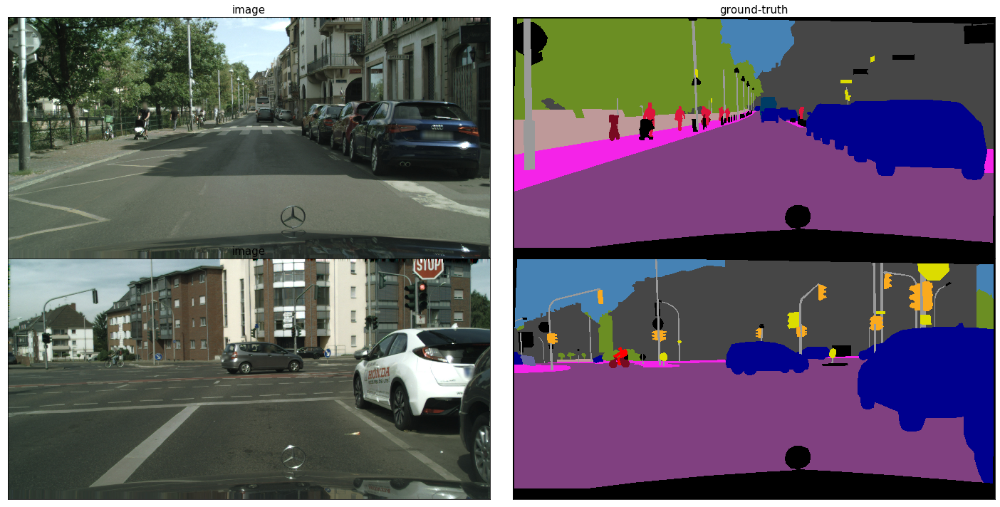

In [30]:
# Define the number of images to show:
nb_show = 2

random_ids = np.random.choice(len(train_input_files), size = nb_show)

# Take the image samples:
train_input_files_samples = [train_input_files[i] for i in random_ids]
train_gt_files_samples = [train_gt_files[i] for i in random_ids]

images_samples = [io.imread(file) for file in train_input_files_samples]
gt_samples = [io.imread(file) for file in train_gt_files_samples]
gt_colours = [convert_labels_to_colours_numpy(label = mask) for mask in gt_samples]

# Plot:
fig = plot_images_inGrid(images=[images_samples, gt_colours], titles=["image", 'ground-truth'])
fig.show()

## 5 - Setting up the Input Pipeline:

Here, "tf.data" API will be used to build the input pipeline for serving the training and validation batches to the models.

### 5.1 - Image Parsing and Augmentation:

There will be some defined TensorFlow-based Functions here to parse thse images and label files to convert them into proper tensors as well as the option to augment the data.

As the FCN-8s is based on the VGG-16 model that utilises 224x224 images (square images), the ratio of the images will be changed to be square as well. A scaler (done by saving the original ratio/shape) will be used to scale the predictions back to the original shape in the post-processing stage. 

In [31]:
images = images_samples

# Define the Image Ratio fro Scaling in Post-Processing:
CITYSCAPES_IMG_RATIO = int(images[0].shape[1] / int(images[0].shape[0]))

print("Cityscape image shape = {} --> ratio = {} (to reshape squared images later)".format(
    images[0].shape, CITYSCAPES_IMG_RATIO))

Cityscape image shape = (1024, 2048, 3) --> ratio = 2 (to reshape squared images later)


#### Function to parse the pairs of filenames that is yielded by the data pipeline into tensors:

In [32]:
def parse_func(filenames, resize_to=[226, 226], augment=True):
    """ This Parses the files into input/label image pair.
    Parameters:
        - filenames, is the Dict that contains the file(s). (filenames['image'], filenames['label'])
        - resize_to, is the Height x Width Dimensions to resize the image and label into.
        - augment, is an optional Flag to augment the data pairs.
    Returns:
        - returns an Input tensor, Label tensor.
    """
    # Get the image and label filenames:
    img_filename, gt_filename = filenames['image'], filenames.get('label', None)
    
    # Read the file and return as Bytes:
    image_string = tf.io.read_file(img_filename)
    
    # Decode the data into an Image:
    image_decoded = tf.io.decode_jpeg(image_string, channels=3)
    
    # Convert the image to Float:
    image = tf.image.convert_image_dtype(image_decoded, tf.float32)
    
    # Resize the image:
    image = tf.image.resize(image, resize_to)
    
    # Apply the same as above to the Labels:
    if gt_filename is not None:
        gt_string = tf.io.read_file(gt_filename)
        gt_decoded = tf.io.decode_png(gt_string, channels=1)
        gt = tf.cast(gt_decoded, dtype=tf.int32)
#         gt = tf.cast(gt_decoded, dtype=tf.float32)
        gt = tf.image.resize(gt, resize_to, method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    
        # Augmenting: if True
        if augment:
            image, gt = _augmenation_func(image, gt)
        return image, gt
    
    else:
        if augment:
            image = _augmenation_func(image)
        return image


#### Augmentation of the data, Applying several random transformations:

The following will be functions to be used in the input pipeline to apply:
- Data Augmentation
- Random Ttransformations (like random colour/brightness changes, random horizontal flip, random cropping/scaling and so on.)

Note, there will be some care into applying these transformations to both the input image and the target label map, such as if flipping or crop the image is done, the same would be applied to the label map to keep things consistent.

In [33]:
def _augmenation_func(image, gt_image=None):
    """ This builds a function to apply random transforamtion to augment the training images.
    Parameters:
        - images, is the input images.
    Returns:
        - returns Augmented Images.
    Note:
        To randomly flip or crop the images, will require the same to be applied to the label for
        consistency.
    """
    original_shape = tf.shape(image)[-3:-1]
    nb_image_chnls = tf.shape(image)[-1]
    
    # Stack the image and label together along the channel axis for the random operations
    # (flip or resize/crop) to be applied to both:
    if gt_image is None:
        stacked_images = image
        nb_stacked_chnls = nb_image_chnls
    else:
        stacked_images = tf.concat([image, tf.cast(gt_image, dtype=image.dtype)], axis=-1)
        nb_stacked_chnls = tf.shape(stacked_images)[-1]
        
    # Apply random horizontal flip:
    stacked_images = tf.image.random_flip_left_right(stacked_images)
    
    # Apply random cropping:
    random_scale_factor = tf.random.uniform([], minval=.8, maxval=1., dtype=tf.float32)
    crop_shape = tf.cast(tf.cast(original_shape, tf.float32) * random_scale_factor, tf.int32)
    
    if len(stacked_images.shape) == 3:
        # For a singel images:
        crop_shape = tf.concat([crop_shape, [nb_stacked_chnls]], axis = 0)
    else:
        # for batched images:
        batch_size = tf.shape(stacked_images)[0]
        crop_shape = tf.concat([[batch_size], crop_shape, [nb_stacked_chnls]], axis = 0)
    stacked_images = tf.image.random_crop(stacked_images, crop_shape)
    
    # The following transformations will be applied differently to the input and gt images
    # (nearest-neighbor resizing for the label image VS interpolated resizing for the image),
    # or applied only to the input image. Hence, split them back:
    image = stacked_images[..., :nb_image_chnls]
    
    # Resize the image back to the expected dimensions:
    image = tf.image.resize(image, original_shape)
    
    # Apply random Brightness/Saturation changes:
    image = tf.image.random_brightness(image, max_delta=0.15)
    image = tf.image.random_saturation(image, lower=0.5, upper=1.75)
    image = tf.clip_by_value(image, 0.0, 1.0) # to keep pixel values in check.
    
    if gt_image is not None:
        gt_image = tf.cast(stacked_images[..., nb_image_chnls:], dtype=gt_image.dtype)
        gt_image = tf.image.resize(gt_image, original_shape, method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
        
        return image, gt_image
    else:
        return image        
    

#### Complete by putting everything together:

Here, the functions above will be wrapped into an input function to be called to instantiate the data pipeline.

In [34]:
# Import the required library:
import functools

In [35]:
def segmentation_input_func(image_files, gt_files=None, resize=[256, 256], shuffle=False, 
                            batch_size=32, nb_epochs=None, augment=False, seed=None):
    """ This is the Input Data Pipeline for Semantic Segmentation applications.
    Parmeters:
        - image_files, is the List of input image files.
        - gt_files, is an optional List of corresponding label image files.
        - resize_to, is the Heigh x Width dimensions for resizing the image and label.
        - shuffle, is a Flag to shuffle the dataset.
        - batch_size, is the batch size.
        - nb_epochs, is the number of epochs the dataset will be iterated over.
        - augment, is an optional Flag to augment the image pairs.
        - seed, is an optional Flag to set the seed for reproducibility purposes.
    Returns:
        - returns tf.data.Dataset
    
    """
    # Convertting to TensorFlow Dataset format:
    image_files = tf.constant(image_files)
    data_dict = {'image': image_files}
    
    if gt_files is not None:
        gt_files = tf.constant(gt_files)
        data_dict['label'] = gt_files
    
    # Get the slices of an array in the form of objects (Dict):
    dataset = tf.data.Dataset.from_tensor_slices(data_dict)
    
    # If Shuffle is set to True:
    if shuffle:
        dataset = dataset.shuffle(buffer_size = 1000, seed= seed)
    dataset = dataset.prefetch(1)
    
    # Batching and Adding the Parsing Operation:
    parse_fn = functools.partial(parse_func, resize_to=resize, augment=augment)
    dataset = dataset.map(parse_fn, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset = dataset.batch(batch_size)
    
    dataset = dataset.repeat(nb_epochs)
    
    return dataset   
    

In [36]:
def cityscapes_input_func(split='train', root_folder=CITYSCAPES_FOLDER, resize_to=[256, 256], shuffle=False,
                          batch_size=32, nb_epochs=None, augment=False, seed=None, blurred=False):
    """ This sets up the Input Data Pipeline for Semantic Segmentation applications for
        the Dataset -> Cityscapes dataset.
    Parameters:
        - split, is the Split name such as ('train', 'val', 'test')
        - root_folder, is the Cityscapes root folder.
        - resize_to, is the Height x Width dimensions to resize the image and label.
        - shuffle, is an optional Flag to shuffle the dataset.
        - batch_size, is the Batch size.
        - nb_epochs, is the number of epochs that the dataset would be iterated over.
        - augment, is the Flag to augment the image pairs.
        - seed, is an optional Flag to set the seed for reproducibility purposes.
        - blurred, is the FLag to use images with faces and immatriculation plates blurred
                   (for display).
    Returns:
        - returns tf.data.Dataset
    """
    # Set up the dataset type: blurred or not.
    type = "leftImg8bit_blurred" if blurred else "leftImg8bit"

    # Process the files:
    input_files, gt_files = extract_cityscapes_file_pairs(split=split,
                                                          type=type,
                                                          root_folder=root_folder)

    return segmentation_input_func(image_files=input_files,
                                   gt_files=gt_files,
                                   resize = resize_to,
                                   shuffle=shuffle,
                                   batch_size=batch_size,
                                   nb_epochs=nb_epochs,
                                   augment=augment,
                                   seed=seed)


##### Below shows an example on calling the above methods:

In [37]:
# Define the parameters:
batch_size = 16
nb_epochs = 50
image_size = [512, 512]

# Extract and Process the dataset:
train_dataset = segmentation_input_func(image_files=train_input_files_samples, 
                                        gt_files=train_gt_files_samples, 
                                        resize=image_size, 
                                        batch_size=batch_size,
                                        shuffle=True, 
                                        nb_epochs= nb_epochs, 
                                        augment=True)

val_dataset = segmentation_input_func(image_files=val_input_files, 
                                      gt_files=val_gt_files, 
                                      resize=image_size, 
                                      batch_size=batch_size,
                                      shuffle=False, 
                                      nb_epochs= nb_epochs, 
                                      augment=False)

### 5.2 - Data Visualisation Tools:

Here, more helper functions/methods will be defined to post-process the results. These will be used for visualising the results.

In [38]:
# Define a Constant Tensorflow variable for the Colours:
CITYSCAPES_COLOURS_TF = tf.constant(CITYSCAPES_COLOURS, dtype=tf.int32)

In [39]:
def change_ratio(image=None, pred=None, gt=None, ratio=CITYSCAPES_IMG_RATIO):
    """ This builds a function to Resize the Images to the appropriate defined ratios.
    Parameters:
        - image, is an optional Input Image.
        - pred, is an optional Predicted label image.
        - gt, is an optional Target Image.
        - ratio, is the defined ratio to be set for the images.
    Returns:
        - returns the 3 resized images.
    """
    # Check and set the input:
    valid_input = image if image is not None else pred if pred is not None else gt
    
    # Define the current size of the input:
    current_size = tf.shape(valid_input)[-3:-1]
    
    # Define the width * ratio:
    width_with_ratio = tf.cast(tf.cast(current_size[1], tf.float32) * ratio, tf.int32)
    
    # stack the size with the width_with_ratio:
    size_with_ratio = tf.stack([current_size[0], width_with_ratio], axis=0)
    
    if image is not None:
        image = tf.image.resize(images = image, 
                                size = size_with_ratio)
        
    if pred is not None:
        pred = tf.image.resize(images=pred, 
                               size=size_with_ratio, 
                               method= tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    
    if gt is not None:
        gt = tf.image.resize(images= gt,
                             size= size_with_ratio,
                             method= tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    
    return image, pred, gt

In [40]:
def convert_label_to_colours(label, one_hot=True, nb_classes=len(CITYSCAPES_LABELS),
                             colour_tensor=CITYSCAPES_COLOURS_TF):
    """ This converts the Label images into Coloured ones, for the purposes of displaying thm.
    Paramters:
        - label, is the Label Image (tensor).
        - one_hot, is the Flag to one-hot encode the label images if they are not encoded.
        - nb_classes, is the number of classes for one-hot-encoding.
        - colour_tensor, is the TTensor mapping labels to colours.
    Returns:
        - returns the Colour Map.
    """
    # Define the shape and channels:
    label_shape = tf.shape(label)
    colour_channels = tf.shape(colour_tensor)[-1]
    
    # Check to one-hot encode the label:
    if one_hot:
        label = tf.one_hot(label, nb_classes)
    else:
        label_shape = label_shape[:-1]
    
    # Return the labels as coloured ones:
    label = tf.reshape(tf.cast(label, tf.int32), (-1, nb_classes))
    colours= tf.matmul(label, colour_tensor)
    
    return tf.reshape(colours, tf.concat( [label_shape, [colour_channels]] , axis = 0))   
    
    

In [41]:
def postprocess_to_show_images(image=None, pred=None, gt=None, one_hot=True, ratio=CITYSCAPES_IMG_RATIO):
    """ This post-processes the training results of the segmentation model for display. 
        The training results should be tensors.
    Parameters:
        - image, is an optional Input image tensor.
        - pred, is an optional Predicted label map tensor.
        - gt, is an optional target label map tensor.
        - one_hot, is the Flag to one-hot-encode the label images if they were not done yet.
        - ratio, is the Original image ratios.
    Returns:
        - returns the processed image tensor(s).
    """
    # Define a list to store the output:
    out = []
    
    # Apply a change of ratios to the images:
    image_show, pred_show, gt_show = change_ratio(image, pred, gt, ratio)
    
    # Update the Output list:
    if image is not None:
        out.append(image_show)
    
    if pred is not None:
        if one_hot:
            # Remove the unnecessary channel dimensions:
            pred_show = tf.squeeze(pred_show, -1)
        pred_show = convert_label_to_colours(pred_show, one_hot=one_hot)
        out.append(pred_show)
        
    if gt is not None:
        # Remove the unnecessary channel dimensions:
        gt_show = tf.squeeze(gt_show, -1)
        gt_show = convert_label_to_colours(gt_show)
        out.append(gt_show)
        
    return out if len(out) > 1 else out[0]
    

##### With the above functions defined, next is to test the functions/methods to visualise some of the augmented images from the training set:

D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\ipykernel_launcher.py:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


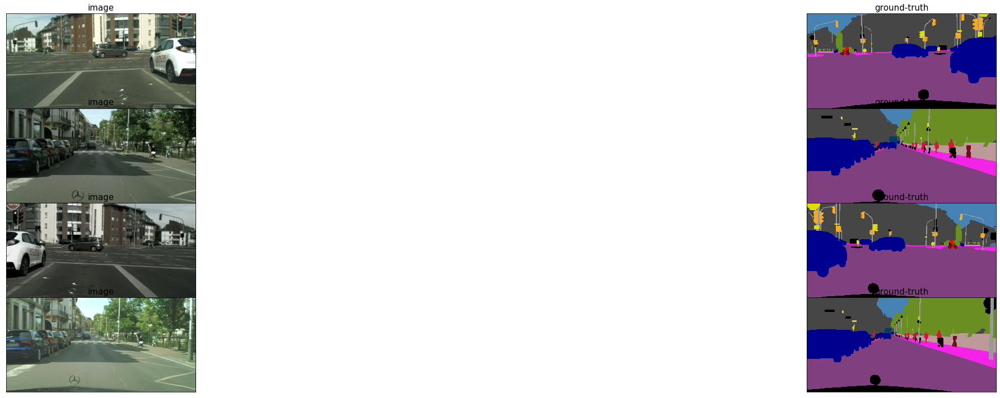

In [42]:
# Define the Number of images to show:
nb_show = 2

train_dataset_iter = train_dataset.__iter__()

# Select the images:
train_images1, train_labels1 =  next(train_dataset_iter)
train_images2, train_labels2 =  next(train_dataset_iter)

# Concatenate the images and label separately:
train_images = np.concatenate((train_images1[:nb_show], train_images2[:nb_show]), axis=0)
train_labels = np.concatenate((train_labels1[:nb_show], train_labels2[:nb_show]), axis=0)

# Post process these images:
image_show, gt_show = postprocess_to_show_images(image=train_images, pred=train_labels)

# Plot:
fig = plot_images_inGrid(images=[image_show, gt_show], titles=["image", 'ground-truth'])
fig.show()

#### Now, that the input pipeline is completed and prepared, these can be used for the next part of the this notebook.


## 6 - Object and Instance Segmentation with U-Net model:

The U-Net model will be implemented here and be applied to the scenes available from the Cityscapes dataset. The U-Net model differs to the FCN-8s in terms of its loss function, where here the __Dice Loss__ will be applied and that further post-processing of the prediction will be done with __Conditional Random Fields (CRFs)__. 

## 6.1 - Dataset Preparation:

As mentioned earlier, the input pipeline functions/methods above will be save into a ".py" file, and these will be called from the file to be used below. The filename = __dataset_utilities.py__

In [43]:
# Import the utility files:
from dataset_utilities import (CITYSCAPES_FOLDER,
                               CITYSCAPES_LABELS,
                               CITYSCAPES_IGNORE_VALUE,
                               cityscapes_input_func,
                               extract_cityscapes_file_pairs,
                               postprocess_to_show_images)

# Import the required library:
import math

#### Define the Key Variables for data preparation:

In [44]:
# batch_size     = 16
batch_size     = 4

nb_epochs      = 300
image_size     = [512, 512]
nb_channels   = 3
nb_classes    = len(CITYSCAPES_LABELS)
random_seed    = Seed_nb
nb_show       = 3

#### Grab the dataset:

In [45]:
# Define the number of images for traning and validation set:
nb_train_imgs = len(extract_cityscapes_file_pairs(split='train',
                                                  root_folder=CITYSCAPES_FOLDER)[0]
                   )

nb_val_imgs = len(extract_cityscapes_file_pairs(split='val',
                                                root_folder=CITYSCAPES_FOLDER)[0]
                 )
                  
# Dataset: 
# as these will be using the blurred dataset, 
# there is no need to set the blurred parameter to True.
train_dataset = cityscapes_input_func(root_folder=CITYSCAPES_FOLDER,
                                      resize_to=image_size,
                                      shuffle=True,
                                      batch_size=batch_size,
                                      nb_epochs=nb_epochs,
                                      augment=True,
                                      seed=random_seed,
                                      blurred=True)

val_dataset = cityscapes_input_func(root_folder=CITYSCAPES_FOLDER,
                                    resize_to=image_size,
                                    shuffle=False,
                                    batch_size=batch_size,
                                    nb_epochs=nb_epochs,
                                    augment=False,
                                    seed=random_seed,
                                    blurred=True)

# 


#### Instantiate a Validation set for visualisation purposes:

To visualise the validation set consisting of blurred images (such as faces and vehicle number plates). Here, the "tf.data.Dataset" will be used to extract one batch of 2-3 images.

In [46]:
# Grab the dataset:
visualisation_val_dataset = cityscapes_input_func(root_folder=CITYSCAPES_FOLDER,
                                                  resize_to=image_size,
                                                  shuffle=True,
                                                  batch_size=nb_show,
                                                  nb_epochs=1,
                                                  augment=False,
                                                  seed=random_seed,
                                                  blurred=True)

# Grab the samples:
val_image_samples, val_gt_samples = next(visualisation_val_dataset.__iter__())

# Delete the main "visualisation_val_dataset":
del visualisation_val_dataset

In [47]:
# Define the Number of batches per train/val epoch: this is to guide the Keras `fit` method.
train_steps_per_epoch = math.ceil(nb_train_imgs / batch_size)
val_steps_per_epoch   = math.ceil(nb_val_imgs / batch_size)

## 6.2 - Build the U-Net model:

The U-Net model here will be the same as the one implemented in previous notebooks (Notebook 2). Here, the model will be trained on the urban street images from the Cityscapes dataset. 

### U-net architecture taken from earlier:

<img src="Description Images/U_net.PNG" width="450">

Image Ref -> https://heartbeat.fritz.ai/deep-learning-for-image-segmentation-u-net-architecture-ff17f6e4c1cf

From the above, U-Net architecture is separated in 3 parts where:
1) The contracting/downsampling path. \
2) Bottleneck. \
3) The expanding/upsampling path.

The encoders are on the left while the decoders are on the right (Highlighted in RED). Highlighted in ORANGE are the skip connections that connects the encoders to the decoding block where it will be concatenated. 

#### For the Contracting path:
It is composed of 4 blocks, where each of the block is composed of:

- 3x3 Convolution Layer + activation function (with batch normalization)
- 3x3 Convolution Layer + activation function (with batch normalization)
- 2x2 Max Pooling

#### For the Bottleneck:
This sits between the contracting and expanding paths. The bottleneck is built from simply 2 convolutional layers (with batch normalization), with dropout.

#### For the Expanding path:
It is also composed of 4 blocks, where each of these blocks is composed of:

- Deconvolution layer with stride 2
- Concatenation with the corresponding cropped feature map from the contracting path
- 3x3 Convolution layer + activation function (with batch normalization)
- 3x3 Convolution layer + activation function (with batch normalization)

#### Implementation Notes:

Using a bottom-up approach, the implementation will start with a function wrapping the operations performed by the Convolutions, then proceeded by another wrapping fucntion for each block of 2 Convolutions together.

In [48]:
# Import the required Libraries:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input

# Import the U-Net Model:
from unet_model_v2 import unet
# from unet import unet

### 6.2.1 - Define the Network Hyperparameters:

In [49]:
kernel_size    = 4
filters_orig   = 32
layer_depth    = 4
use_batch_norm = batch_size > 1

### 6.2.2 - Instantiate the U-Net model:

In [50]:
# Instantiate the Model:
inputs = Input(shape=(*image_size, nb_channels), name = 'input')

# Model output: Setting finaal_actiavtion to None so that the U-Net output is in logits.
outputs = unet(x=inputs,
               out_channels=nb_classes,
               kernel_size=kernel_size,
               filters_orig=filters_orig,
               layer_depth=layer_depth,
               batch_norm=use_batch_norm,
               final_activation=None 
              )

# outputs = unet(x=inputs, out_channels=nb_classes, 
#                layer_depth=layer_depth, filters_orig=filters_orig, 
#                kernel_size=kernel_size, batch_norm=use_batch_norm,
#                final_activation=None # we define our U-Net to output logits.
#               )

# Model Summary:
unet_model = Model(inputs, outputs)
unet_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
enc_conv0-1 (Conv2D)            (None, 512, 512, 32) 1568        input[0][0]                      
__________________________________________________________________________________________________
enc_bn0-1 (BatchNormalizationV2 (None, 512, 512, 32) 128         enc_conv0-1[0][0]                
__________________________________________________________________________________________________
enc_act0-1 (LeakyReLU)          (None, 512, 512, 32) 0           enc_bn0-1[0][0]                  
______________________________________________________________________________________________

## 7 - Define the Loss function and Metric Functions:

Here, the loss and metrics functions will be reused from the previous notebook. These can be found in the "custom_TF_loss_and_metric.py" file.

The loss function used for this model would be the Cross-Entropy loss.

In [51]:
# Import the required libraries:
from custom_TF_loss_and_metrics import (SegmentationAccuracy, 
                                        SegmentationLoss,
                                        SegmentationMeanIoU,
                                        get_mask_for_valid_labels)

## 8 - Define other training helpers:

To visualise the samples before or after training, create a method that predicts and post-process the results. This entails:
- Converting the logit maps into probabilities with the Softmax function,
- Selecting the greatest probability value in terms of class for each of the pixel with the Argmax funciton,
- Converting the predicted label maps into Coloured RGB label images for visualisation purposes.

Further, the input images and target labels will also be processed to scale them back to normal.

In [52]:
# Import the required library:
from plotting_utilities import plot_images_inGrid

In [53]:
def predict_and_postprocess(images, gt_labels):
    """ This utilises the U-Net model to predict the label map, 
        and post process them for visualisation.
    Parameters:
        - images, are the Images.
        - gt_labels, are the Ground-truth Label maps.
    Returns:
        - returns Images, Predicted label maps and GT label maps for displaying.
    """
    
    # grab the one-hot encoded predicted results:
    predicted_onehot = unet_model(images)
    
    # Convert the predicted logits into Categorical results:
    # for each pixel, we assign the class corresponding to the largest logit/probability.
    predicted = tf.math.argmax(predicted_onehot, axis= -1)
    predicted = tf.expand_dims(predicted, axis= -1)
    
    # Post process for visualisation:
    image_show, predicted_show, gt_show = postprocess_to_show_images(image=images,
                                                                     pred=predicted,
                                                                     gt=gt_labels,
                                                                     one_hot=True,
                                                                     ratio=2)
    
    return image_show, predicted_show, gt_show
    

### Check to see if the "predict_and_postprocess" function works:

D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\ipykernel_launcher.py:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


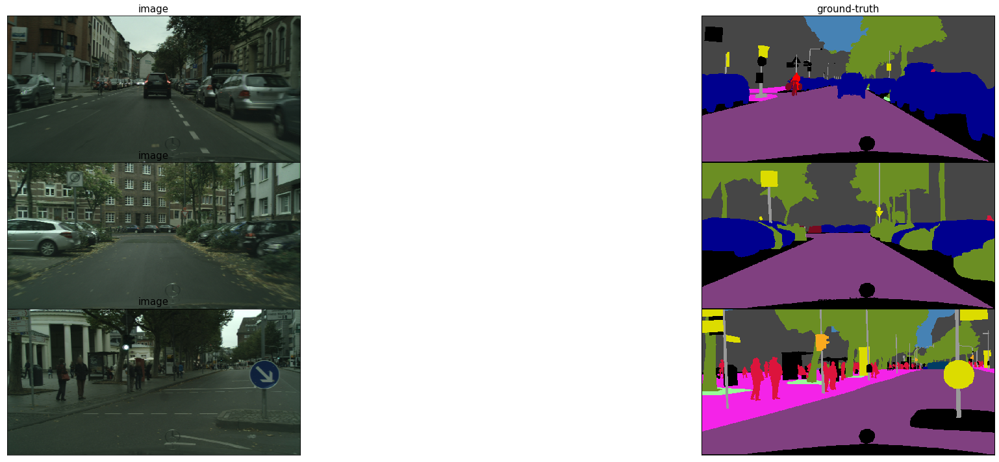

In [54]:
# Process:
image_show, predicted_show, gt_show = predict_and_postprocess(images = val_image_samples,
                                                              gt_labels = val_gt_samples)

# Plot:
fig = plot_images_inGrid(images=[image_show.numpy(), gt_show.numpy()], 
                         titles=["image", 'ground-truth'])
fig.show()

Seems like everything is working. 

## 9 - Callbacks:

Set up callbacks for the training process.

In [55]:
# Import the required library:
from customCallbacks_Keras import TensorBoard_ImageGrid_Callback

In [56]:
def postprocess_for_grid_callback(input_images, predicted_images, gt_images):
    # Convert the predicted logits into Categorical results:
    # for each pixel, we assign the class corresponding to the largest logit/probability.
    predicted_images = tf.math.argmax(predicted_images, axis= -1)
    predicted_images = tf.expand_dims(predicted_images, axis = -1)
    
    # Post Process the tensors for Visualisation:
    images_show, predicted_show, gt_show = postprocess_to_show_images(image=input_images,
                                                                     pred=predicted_images,
                                                                     gt=gt_images,
                                                                     one_hot=True,
                                                                     ratio=2)
    return images_show, predicted_show, gt_show 

## 10 - Training the U-Net model on the Dataset:

In [57]:
# Import the required library:
import collections
from customCallbacks_Keras import Simplified_LogCallback

In [58]:
# Set up Path Directory to Save the Model:
model_dir = os.path.join('.', 'models', 'UNet_CityscapesDat')

# Set up the Metrics to Print:
metrics_to_print = collections.OrderedDict([("loss", "loss"), 
                                            ("v-loss", "val_loss"),
                                            ("acc", "acc"), 
                                            ("v-acc", "val_acc"),
                                            ("mIoU", "mIoU"), 
                                            ("v-mIoU", "val_mIoU")])

callbacks = [
    
    # Callback to interrupt the training if the validation loss/metric stops imrpoving for some amount of epochs:
    tf.keras.callbacks.EarlyStopping(monitor ='val_loss',
                                     patience = 2,
                                     restore_best_weights = True
                                    ),
    
    # Callback to log the graph, Losses and Metrics into TensorBoard:
    tf.keras.callbacks.TensorBoard(log_dir = model_dir,
                                    histogram_freq = 0,
                                    write_graph = True
                                  ),
    
    # Callback to save the model specifying the epoch and val-loss in the filename:
    tf.keras.callbacks.ModelCheckpoint(
        os.path.join(model_dir, 'weights-epoch{epoch:02d}-loss{val_loss:.2f}.h5'), period=5),
    
    # Log the Callbacks:
    Simplified_LogCallback(metrics_dict = metrics_to_print,
                           nb_epochs = nb_epochs,
                           log_frequency= 10
                          ),
    
    # Callback to log some validation results as Image Grids into TensorBoard:
    TensorBoard_ImageGrid_Callback(log_dir = model_dir,
                                   input_images = val_image_samples,
                                   target_images= val_gt_samples,
                                   tag='UNet_CityscapesDat_results',
                                   figsize=( 15, 15 ),
                                   grayscale=True,
                                   transpose=True,
                                   preprocess_fn=postprocess_for_grid_callback)
            ]


<Figure size 4500x4500 with 0 Axes>

#### Load in Saved Weights:

In [59]:
# Set the model to load for:
model = unet_model

# Load Previous Model Weights (when kernel crashes):
found_folder = None
for weight_folder in os.listdir('.\\models\\'):
    if(model_dir.split('.\\models\\')[1] == weight_folder):
        found_folder = str(weight_folder)
        
if(model_dir.split('.\\models\\')[1] == found_folder):

    All_saved_weightFiles = []
    for filename in os.listdir(model_dir):
        if 'weights-epoch' in filename:
            All_saved_weightFiles.append(filename)
            weights_file_name = All_saved_weightFiles[-1]
            model.load_weights(model_dir + '/' + weights_file_name)
    
    if not All_saved_weightFiles:
        print('Folder found, but Weights file was not found, Proceeding to creating a new one.')
        pass
    else:
        print("Model's weigth folder was found, proceeding to using previous Saved Weights.")
        print("Saved Weights Filename -> {}".format(weights_file_name))
        
else:
    print("Model's weight folder was not found inside '.\models\' folder. Proceeding to creating a new one.'")
    pass 

Model's weigth folder was found, proceeding to using previous Saved Weights.
Saved Weights Filename -> weights-epoch40-loss0.22.h5


#### With the Weighths loaded, begin training again:

In [60]:
# Define the optimiser:
# optimiser = tf.keras.optimizers.Adam(learning_rate=1e-5, epsilon=0.1, clipvalue=0.5)
optimiser = tf.keras.optimizers.Adam()

# Compile the model:
unet_model.compile(optimizer=optimiser,
                    loss= SegmentationLoss(from_logits=True),
                    metrics=[SegmentationAccuracy(), SegmentationMeanIoU(nb_classes=nb_classes)]
                   )


Instructions for updating:
Use `tf.cast` instead.
Instructions for updating:
Use `tf.cast` instead.


In [61]:
# running time calculation
start = timeit.default_timer()

In [62]:
history_unet = unet_model.fit(train_dataset,
                                epochs=nb_epochs,
                                steps_per_epoch=train_steps_per_epoch,
                                validation_data=val_dataset,
                                validation_steps=val_steps_per_epoch,
                                verbose=0,
                                callbacks=callbacks)

Training: start


D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\tensorflow\python\ops\gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch  1/300: loss = 0.273; v-loss = 0.226; acc = 0.917; v-acc = 0.928; mIoU = 0.460; v-mIoU = 0.484
Training: end


In [63]:
# Stop the timer:
stop = timeit.default_timer()
print('Time: {} Minutes'.format(round((stop - start)/60, 2)))
print('Time: {} hours'.format(round((stop - start)/3600, 2)))

Time: 18.3 Minutes
Time: 0.31 hours


## 11 - Plot the Results:

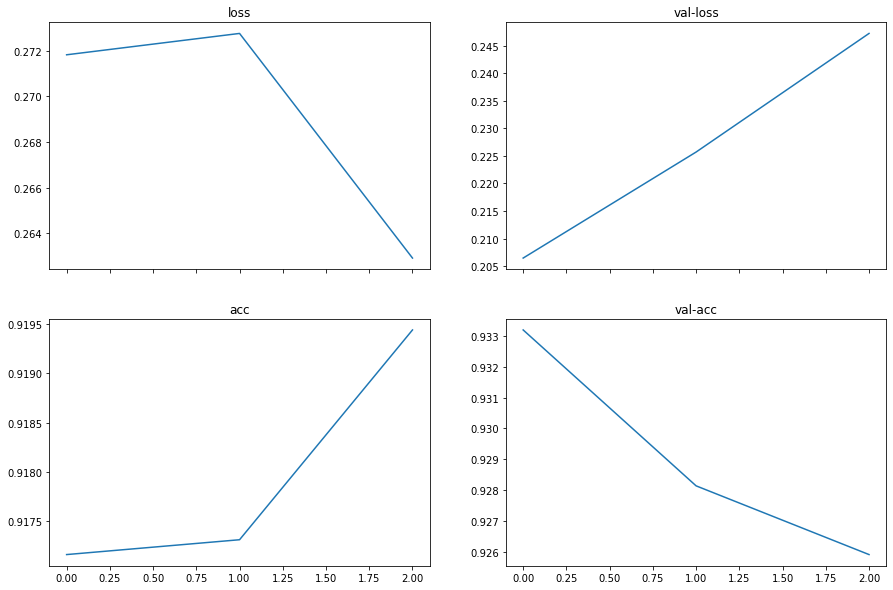

In [64]:
fig, ax = plt.subplots(2, 2, figsize=(15, 10), sharex='col')
ax[0, 0].set_title("loss")
ax[0, 1].set_title("val-loss")
ax[1, 0].set_title("acc")
ax[1, 1].set_title("val-acc")

ax[0, 0].plot(history_unet.history['loss'])
ax[0, 1].plot(history_unet.history['val_loss'])
ax[1, 0].plot(history_unet.history['acc'])
ax[1, 1].plot(history_unet.history['val_acc'])

In [65]:
# Get the best performing scores:
best_val_accuracy = max(history_unet.history['val_acc']) * 100

# Print out the results:
print("Best Validation Accuracy: {:2.2f}%".format(best_val_accuracy))

Best Validation Accuracy: 93.32%


D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\ipykernel_launcher.py:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


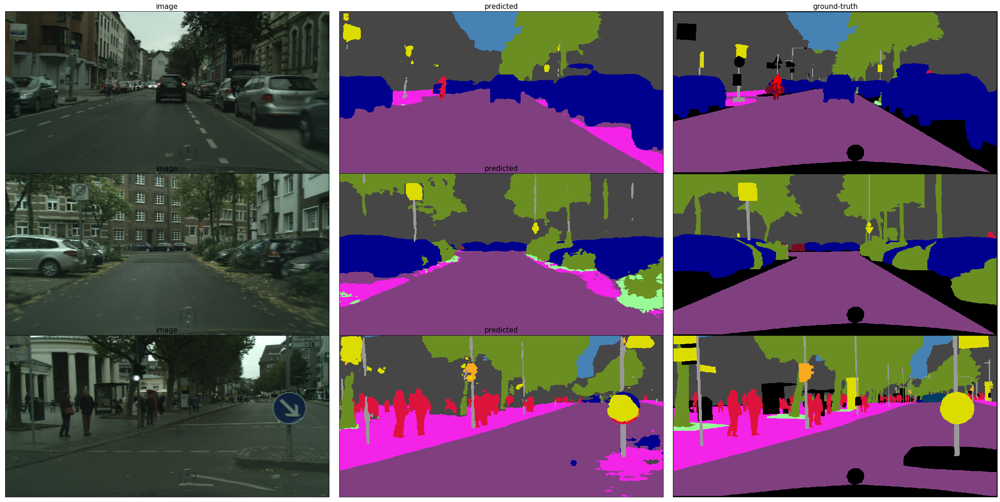

In [66]:
# Process:
image_show, predicted_show, gt_show = predict_and_postprocess(images = val_image_samples,
                                                              gt_labels = val_gt_samples)

# Plot:
fig = plot_images_inGrid(images=[image_show.numpy(), predicted_show.numpy(), gt_show.numpy()], 
                         titles=["image",'predicted', 'ground-truth'])
fig.show()


### Observation:

Interestingly, the U-Net was able to perform well with an accuracy score of ~93.4% compared to the FCN-8s model (93.59% non-weighted loss and 93.37% for weighted loss). As the FCN-8s was pre-trained with ImageNet and the model was able perform slightly better than the current U-Net model. Both these models can also be observed to ignore the smaller classes, hence the introduction of the weighted cross-entropy loss for the FCN-8s model. 

Below, an alternative loss such as the Dice Loss would be introduced and applied to counter and balance out the smaller classes in the dataset. Another interesting observation is that the U-net model seems to be able to produce masks that are less coarse compared to the FCN-8s model.


## 12 - Next Stage -> Improve the Accuracy of the Model for Segmentation:

Previously in the last notebook, the Weighted Segmentation Loss was used to improve FCN-8s model's accuracy. The strategy employed was to balance the smaller classes compared to the larger classes (in terms of frequency). Here, new implementations of the Loss function will be used and this will be the __Dice Loss__ function.

### 12.1 - Dice Loss:

This loss function is good because it is not limited by the problem of __Class Imbalance__ within the dataset.

In [67]:
def dice_coeff(y_true, y_pred,  smooth=1e-6):
    
    # Flatten the tensors:
    y_true_flat = tf.reshape(y_true, [-1])
    y_pred_flat = tf.reshape(y_pred, [-1])
    
    # Compute the Intersection:
    intersection = tf.reduce_sum(y_true_flat * y_pred_flat)
    
    # Compute the Coeff:
    dice_coeff = (2. * intersection + smooth) / (tf.reduce(y_true_flat) + tf.reduce_sum(y_pred_flat) + smooth)
    
    return dice_coeff

In [68]:
def dice_coeff_multilabel(y_true, y_pred, nb_classes=nb_classes):
    # Change the dtype of the gt-labels tensor:
    y_true = tf.cast( tf.squeeze(y_true), tf.int32 )
    
    # One-hot encode the gt-labels:
    y_true = tf.one_hot(y_true, nb_classes)
    
    # Reshape:
    y_true = tf.reshape(y_true, tf.shape(y_pred))
    
    # Compute the Dice:
    dice = 0
    for i in range(nb_classes):
        dice -= dice_coeff(y_true = y_true[..., i],
                           y_pred = y_pred[..., i],
                           smooth=1e-6)
        
    return dice
    

In [69]:
@tf.function
def dice_loss(y_true, y_pred, ignore_value=CITYSCAPES_IGNORE_VALUE, 
              epsilon=1e-6, spatial_axes=[1, 2], from_logits=False):
    """ This computes the Dice Loss function for segmentation tasks, where it also ignores
        the pixels from the miscellaneous class (=255).
    Parameters:
        - y_true, is the Ground Truth Label map(s) of shape (B x H x W)
        - y_pred, is the Predicted Logit map(s) of shape (B x H x W x N),
                    where N = number of classes.
        - ignore_value, is the trainId value of the ignored classes. 
        - epsilon, is the Epsilon value that is small for smoothing.
        - spatial_axes, is the Spatial axes.
        - from_logits, is the Flag for if the predictions are in logits (meaning not-normalised).
    Returns:
        - returns Dice Loss Value.
    """
    # Define the number of classes:
    nb_classes = y_pred.shape[-1]
    
    # An option: is to build mask to remove the pixels from the ignored classes:
#     if ignore_value is not None:
#         y_true, y_pred = prepare_data_for_segmentation_loss(y_true = y_true, 
#                                                             y_pred = y_pred, 
#                                                             nb_classes= nb_classes, 
#                                                             ignore_value=ignore_value)
        
    # Transform the Logits into Probabilities, then one-hot encode the Ground Truth Labels:
    if from_logits:
        y_pred = tf.nn.softmax(y_pred, axis=-1)
        
    y_true = tf.squeeze( tf.cast(y_true, tf.int32), axis=-1 )
    y_true_oneHot = tf.one_hot(y_true, nb_classes, dtype=y_pred.dtype)
    
    # An option: is to Build Mask to remove pixels from the Ignored Classes:
    if ignore_value is not None:
        mask_for_valid_labels = get_mask_for_valid_labels(y_true= y_true, 
                                                          nb_classes= nb_classes, 
                                                          ignore_value=ignore_value)
        
        mask_for_valid_labels = tf.cast(mask_for_valid_labels, dtype=y_pred.dtype)
        
        mask_for_valid_labels = tf.expand_dims(mask_for_valid_labels, axis=-1)
        
        # Apply the mask:
        y_pred = y_pred * mask_for_valid_labels
        
        y_true_oneHot = y_true_oneHot * mask_for_valid_labels
    
    # Compute the numerator and denominator for Dice:
    numerator_perClass_dice = 2 * tf.reduce_sum(y_pred * y_true_oneHot, axis = spatial_axes)
    denominator_perClass_dice = tf.reduce_sum(y_pred + y_true_oneHot, axis=spatial_axes)
    
    # Compute the Dice and average it over the batch and classes:
    dice = tf.reduce_mean( (numerator_perClass_dice + epsilon) / (denominator_perClass_dice + epsilon) )
    dice = 1 - dice
    
    return dice

In [70]:
class DiceLoss(tf.losses.Loss):
    def __init__(self, ignore_value=CITYSCAPES_IGNORE_VALUE, epsilon=1e-6, spatial_axes=[1, 2],
                from_logits=False, name='loss'):
        """ Initilise the Dice Loss.
        Parameters:
            - ignore_value, is the trainId value of the ignored classes.
            - epsilon, is the Epsilon value that is small for smoothing.
            - spatial_axes, is the Spatial axes.
            - from_logits, is the Flag for if the predictions are in logits (meaning not-normalised).
            - name, is the name.
        """
        # Inherit:
        super().__init__(name=name)
        self.ignore_value = ignore_value
        self.epsilon = epsilon
        self.spatial_axes = spatial_axes
        self.from_logits = from_logits
        
    def _prepare_data(self, y_true, y_pred):
        # Define the number of classes:
        nb_classes = y_pred.shape[-1]
        
        # Prepare the data:
        y_true, y_pred = prepare_data_for_segmentation_loss(y_true = y_true, 
                                                            y_pred = y_pred, 
                                                            nb_classes= nb_classes, 
                                                            ignore_value=seld.ignore_value)
        
        return y_true, y_pred
    
    def __call__(self, y_true, y_pred, sample_weight=None):
        """ This computes the Dice Loss for semantic segmentation task, while ignoring
            the pixels from the miscellaneous class (=255).
        Parameters:
            - y_true, is the Ground Truth Label map(s) of shape (B x H x W)
            - y_pred, is the Predicted Logit map(s) of shape (B x H x W x N),
                        where N = number of classes.
            - sample_weight, is the optional weight tensor, that is broadcastable to 'y_true'.
        """
        dice_loss = dice_loss(y_true = y_true, 
                              y_pred = y_pred, 
                              ignore_value=self.ignore_value, 
                              epsilon=self.epsilon, 
                              spatial_axes=self.spatial_axes, 
                              from_logits=self.from_logits)
        
        return dice_loss
    

## 13 - Training the U-Net model on the Dataset: with Dice Loss.

In [71]:
# Import the required library:
import collections
from customCallbacks_Keras import Simplified_LogCallback

In [72]:
# Set up Path Directory to Save the Model:
model_dir = os.path.join('.', 'models', 'UNet_CityscapesDat_diceloss')

# Set up the Metrics to Print:
metrics_to_print = collections.OrderedDict([("loss", "loss"), 
                                            ("v-loss", "val_loss"),
                                            ("acc", "acc"), 
                                            ("v-acc", "val_acc"),
                                            ("mIoU", "mIoU"), 
                                            ("v-mIoU", "val_mIoU")])

callbacks = [
    
    # Callback to interrupt the training if the validation loss/metric stops imrpoving for some amount of epochs:
    tf.keras.callbacks.EarlyStopping(monitor ='val_loss',
                                     patience = 8,
                                     restore_best_weights = True
                                    ),
    
    # Callback to log the graph, Losses and Metrics into TensorBoard:
    tf.keras.callbacks.TensorBoard(log_dir = model_dir,
                                    histogram_freq = 0,
                                    write_graph = True
                                  ),
    
    # Callback to save the model specifying the epoch and val-loss in the filename:
    tf.keras.callbacks.ModelCheckpoint(
        os.path.join(model_dir, 'weights-epoch{epoch:02d}-loss{val_loss:.2f}.h5'), period=5),
    
    # Log the Callbacks:
    Simplified_LogCallback(metrics_dict = metrics_to_print,
                           nb_epochs = nb_epochs,
                           log_frequency= 10
                          ),
    
    # Callback to log some validation results as Image Grids into TensorBoard:
    TensorBoard_ImageGrid_Callback(log_dir = model_dir,
                                   input_images = val_image_samples,
                                   target_images= val_gt_samples,
                                   tag='UNet_CityscapesDat_diceloss_results',
                                   figsize=( 15, 15 ),
                                   grayscale=True,
                                   transpose=True,
                                   preprocess_fn=postprocess_for_grid_callback)
            ]


<Figure size 4500x4500 with 0 Axes>

#### Load in Saved Weights:

In [73]:
# Set the model to load for:
model = unet_model

# Load Previous Model Weights (when kernel crashes):
found_folder = None
for weight_folder in os.listdir('.\\models\\'):
    if(model_dir.split('.\\models\\')[1] == weight_folder):
        found_folder = str(weight_folder)
        
if(model_dir.split('.\\models\\')[1] == found_folder):

    All_saved_weightFiles = []
    for filename in os.listdir(model_dir):
        if 'weights-epoch' in filename:
            All_saved_weightFiles.append(filename)
            weights_file_name = All_saved_weightFiles[-1]
            model.load_weights(model_dir + '/' + weights_file_name)
    
    if not All_saved_weightFiles:
        print('Folder found, but Weights file was not found, Proceeding to creating a new one.')
        pass
    else:
        print("Model's weigth folder was found, proceeding to using previous Saved Weights.")
        print("Saved Weights Filename -> {}".format(weights_file_name))
        
else:
    print("Model's weight folder was not found inside '.\models\' folder. Proceeding to creating a new one.'")
    pass 

Model's weigth folder was found, proceeding to using previous Saved Weights.
Saved Weights Filename -> weights-epoch20-loss0.16.h5


#### With the Weighths loaded, begin training again:

In [74]:
# Define the optimiser:
# optimiser = tf.keras.optimizers.Adam(learning_rate=1e-5, epsilon=0.1, clipvalue=0.5)
optimiser = tf.keras.optimizers.Adam()

# Compile the model:
unet_model.compile(optimizer=optimiser,
                    loss= SegmentationLoss(from_logits=True),
                    metrics=[SegmentationAccuracy(), SegmentationMeanIoU(nb_classes=nb_classes)]
                   )


In [75]:
# running time calculation
start = timeit.default_timer()

In [76]:
history_unet_diceloss = unet_model.fit(train_dataset,
                                epochs=nb_epochs,
                                steps_per_epoch=train_steps_per_epoch,
                                validation_data=val_dataset,
                                validation_steps=val_steps_per_epoch,
                                verbose=0,
                                callbacks=callbacks)

Training: start


D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\tensorflow\python\ops\gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch  1/300: loss = 0.187; v-loss = 0.151; acc = 0.942; v-acc = 0.949; mIoU = 0.630; v-mIoU = 0.651
Training: end


In [77]:
# Stop the timer:
stop = timeit.default_timer()
print('Time: {} Minutes'.format(round((stop - start)/60, 2)))
print('Time: {} hours'.format(round((stop - start)/3600, 2)))

Time: 55.21 Minutes
Time: 0.92 hours


## 14 - Plot the Results:

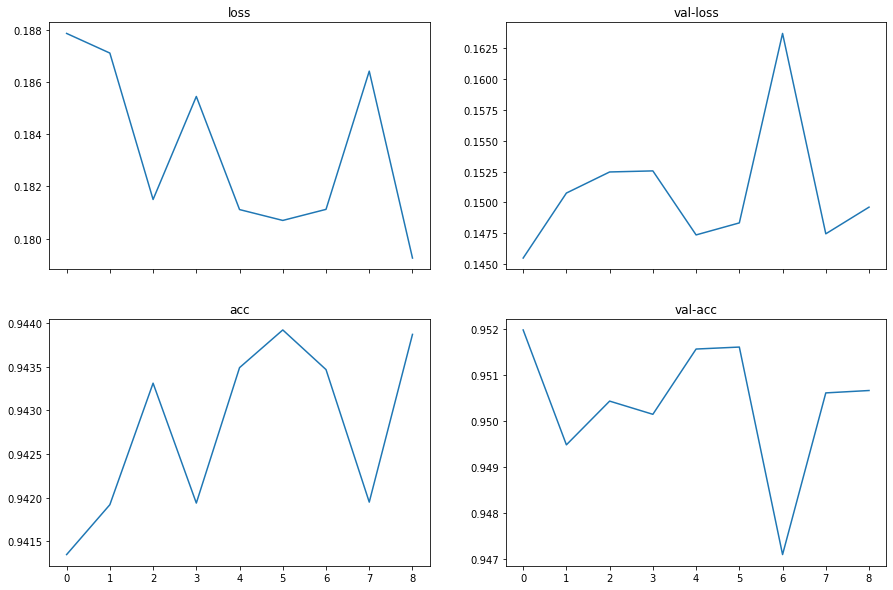

In [78]:
fig, ax = plt.subplots(2, 2, figsize=(15, 10), sharex='col')
ax[0, 0].set_title("loss")
ax[0, 1].set_title("val-loss")
ax[1, 0].set_title("acc")
ax[1, 1].set_title("val-acc")

ax[0, 0].plot(history_unet_diceloss.history['loss'])
ax[0, 1].plot(history_unet_diceloss.history['val_loss'])
ax[1, 0].plot(history_unet_diceloss.history['acc'])
ax[1, 1].plot(history_unet_diceloss.history['val_acc'])

In [79]:
# Get the best performing scores:
best_val_accuracy = max(history_unet_diceloss.history['val_acc']) * 100

# Print out the results:
print("Best Validation Accuracy: {:2.2f}%".format(best_val_accuracy))

Best Validation Accuracy: 95.20%


D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\ipykernel_launcher.py:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


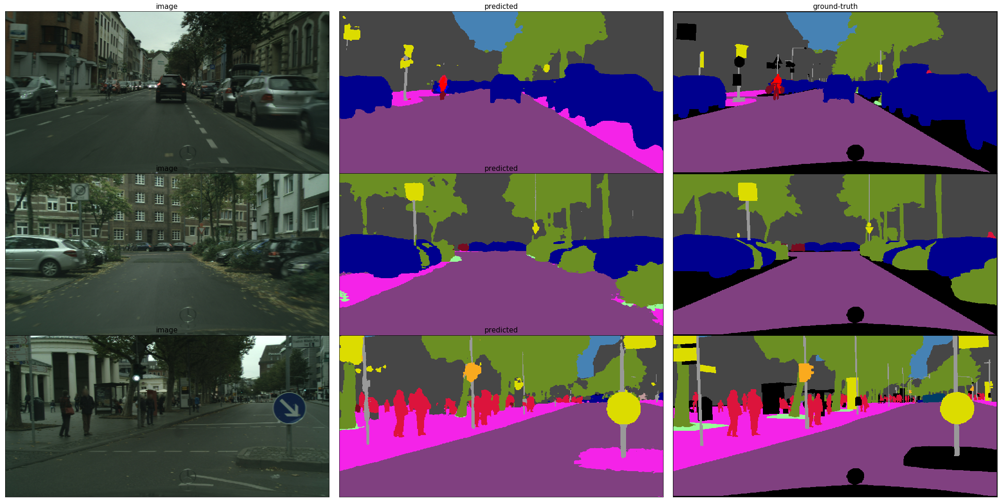

In [80]:
# Process:
image_show, predicted_show, gt_show = predict_and_postprocess(images = val_image_samples,
                                                              gt_labels = val_gt_samples)

# Plot:
fig = plot_images_inGrid(images=[image_show.numpy(), predicted_show.numpy(), gt_show.numpy()], 
                         titles=["image",'predicted', 'ground-truth'])
fig.show()


### Observation:

With the added alternative loss function that is the Dice-Loss, the U-Net model was able to achieve better accuracy at ~95%. This is much better compared to the FCN-8s models (93.59% non-weighted loss and 93.37% for weighted loss). From the "predicted" images above, it can be seen that the model does account for the smaller classes more than before, such as, traffic signs and lights, the poles of the signs and so on. 

## 15 - Post-Processing the Pixel-Level Predictions: with Conditional Random Fields (CRFs).

Briefly, CRFs can be described as a method of discriminative statistical modelling to be employed on a task such as segmentation with the assumption that the class labels for different inputs are dependent. 

In the case of image segmentation, the class label for pixels will depend on the label of its neighbouring pixels as well. Where if the features are (X1, X2, ..., Xn) and label are (Y1, Y2,..., Yn), a discrete classifier like Support Vector Machines (SVM) would have to predict the value of Yi for a given input of Xi, it utilises a single input at a time, and it functions under the assumption that the different inputs are independent. This changes with the assumption changes, where in this case the classifier would perform poorly. When the inputs are dependent, this means that there is a high degree of correlation between the inputs and labels. 

#### A better approach would be to use CRFs. 

<img src="Description Images/CRFs.PNG" width="750">

Image Ref -> https://www.codeproject.com/Articles/559535/Sequence-Classifiers-in-Csharp-Part-II-Hidden-Cond

CRFs will consider the features Xi and the labels of all the other nodes that are dependent on node i to give a prediction for the data point Yi. In CRFs, the data points are arranged in a graph where it consists of a set of nodes V and these are connected with edges E. For when there is an edge between the node i and the node j (connecting two data points), it means that the data point i and j are dependent. This can be seen the diagram above. 

A key advantage of CRF is their great flexibility to include a wide variety of arbitrary, non-independent features of the observations. 

#### Below shows the mathematical formulation:

A linear chain CRF is a distribution $p(Y|X)$ that takes the form:

<img src="Description Images/CRFs_formula1.PNG" width="350">

Image Ref -> https://cedar.buffalo.edu/~srihari/CSE574/Chap13/Ch13.5-ConditionalRandomFields.pdf

Where Z(X) is an instance specific normalization function:

<img src="Description Images/CRFs_formula2.PNG" width="350">

Image Ref -> https://cedar.buffalo.edu/~srihari/CSE574/Chap13/Ch13.5-ConditionalRandomFields.pdf

#### The diagram below shows the overall formulation:

<img src="Description Images/CRFs2.PNG" width="450">

Image Ref -> https://cedar.buffalo.edu/~srihari/CSE574/Chap13/Ch13.5-ConditionalRandomFields.pdf


To apply CRFs to this task, the module from Lucas Beyer (https://github.com/lucasb-eyer/pydensecrf\) will be utilised as a Python Wrapper for dense CRFs with Gaussian edge.

### 15.1 - Requirements and Installation:

Cython will be needed here.

In [81]:
# !pip install cython
# !pip install git+https://github.com/lucasb-eyer/pydensecrf.git

## 16 - CRFs Implementation:

In [82]:
# Import the required libraries:
from pydensecrf import densecrf
from pydensecrf.utils import (
    unary_from_softmax, create_pairwise_gaussian, create_pairwise_bilateral, compute_unary)

#### Things to consider:

Noting the closeness of the pixels in terms of spatiallity and colour, along with the imperfect probability map of the softmax predictions from the CNN, the CRF methods should return a refined label maps that better respects the visual contours. 

### 16.1 - Post-processing the prediction maps:

In [93]:
def crf_postprocessing(input_image, predicted_probs):
    """ this uses the CRF method to post-process the predicted label maps.
    Parameters:
        - input_image, is the Original input RGB image of shape (H x W x 3)
        - predicted_probs, is hte Predicted softmax map(s) of shape (H x W x N)
            where N = number of classes.
    Returns:
        - returns a Refined Softmax Map as Numpy Array with shape (H x W x N).
    """
    # Define the number of classes:
    nb_classes = predicted_probs.shape[-1]
    
    # Define the height and width of image:
    h, w = input_image.shape[:2]
    
    # Instantiate a DenseCRF2D:
    d = densecrf.DenseCRF2D(w, h, nb_classes)
    
    # For densecrf, the predictions has to be formatted with channels being first in time.
    # This means the requirement of transposing the image:
    predicted_probs = np.ascontiguousarray( predicted_probs.transpose((2, 0, 1)) )
    
    # For predictions, densecrf needs unary values (like, -Log(probs)):
    predicted_unary = unary_from_softmax(predicted_probs)
    d.setUnaryEnergy(predicted_unary)
    
    # densecrf taks into account of additional features to refine the predicted label maps.
    # As explained in the `pydensecrf` repo, there is a need to add the color-independent term, 
    # where features are the locations only:
    d.addPairwiseGaussian(sxy=(20, 20), 
                          compat=10, 
                          kernel=densecrf.DIAG_KERNEL, 
                          normalization=densecrf.NORMALIZE_SYMMETRIC)
    
    # Next, add the colour-dependent term:
    # features that are (x, y, r, g, b) based on the input image:
    input_image_uint = (input_image * 255).astype(np.uint8)
    d.addPairwiseBilateral(sxy=(80, 80), 
                           srgb=(5, 5, 5), 
                           rgbim=input_image_uint,
                           compat=10, 
                           kernel=densecrf.DIAG_KERNEL, 
                           normalization=densecrf.NORMALIZE_SYMMETRIC)
    
    # Lastly, perform several inference to obtain the refined predictions:
    refined_preds = np.array( d.inference(5) ).reshape(nb_classes, h, w)
    
    # Transpose the predictions back:
    refined_preds = np.transpose(refined_preds, (1, 2, 0))
    
    return refined_preds
    

#### Test it out with some image samples:

In [94]:
def predict_with_crf(images):
    """ This utilises the Model combined with CRF to predict the label map,
        and post-process the data for visualisation.
    Parameters:
        - images, are the Input Images.
    Returns:
        - returns the Predictions (before and after CRF).
    """
    # Predict with the model:
    preds_softmax = unet_model_with_softmax.predict(images)
    
    # Post-process with CRFs:
    preds_crf_softmax = []
    for i in range(len(images)):
        pred_crf_softmax = crf_postprocessing(images[i], preds_softmax[i])
        preds_crf_softmax.append(pred_crf_softmax)
    
    # Stack/update the list:
    preds_crf_softmax = np.stack(preds_crf_softmax)
    
    # Take the predictions before CRFs:
    preds_softmax = tf.constant(preds_softmax)
    preds = tf.math.argmax(preds_softmax, axis=-1)
    
    # Take the predictions after CRFs;
    preds_crf_softmax = tf.constant(preds_crf_softmax)
    preds_crf = tf.math.argmax(preds_crf_softmax, axis=-1)
    
    return preds_softmax, preds, preds_crf_softmax, preds_crf  
 

### 16.2 - Update the Model Layers with a Softmax layer:

This is because the CRF's inputs requires the output probabilities of softmax from logits.

In [95]:
# Add the softmax layer to the U-Net model:
softmax_outputs = tf.keras.layers.Softmax(axis=-1)(unet_model.outputs[0])

unet_model_with_softmax = Model(unet_model.inputs, softmax_outputs)

In [96]:
# Post-Process:
preds_softmax, preds, preds_crf_softmax, preds_crf = predict_with_crf(images = val_image_samples.numpy())

### 16.3 - Visualise:

D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\ipykernel_launcher.py:29: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


Acc. = 95.85% ; Acc. w/ CRF = 94.08%	|	 mIoU =  0.51 ; mIoU w/ CRF =  0.44.


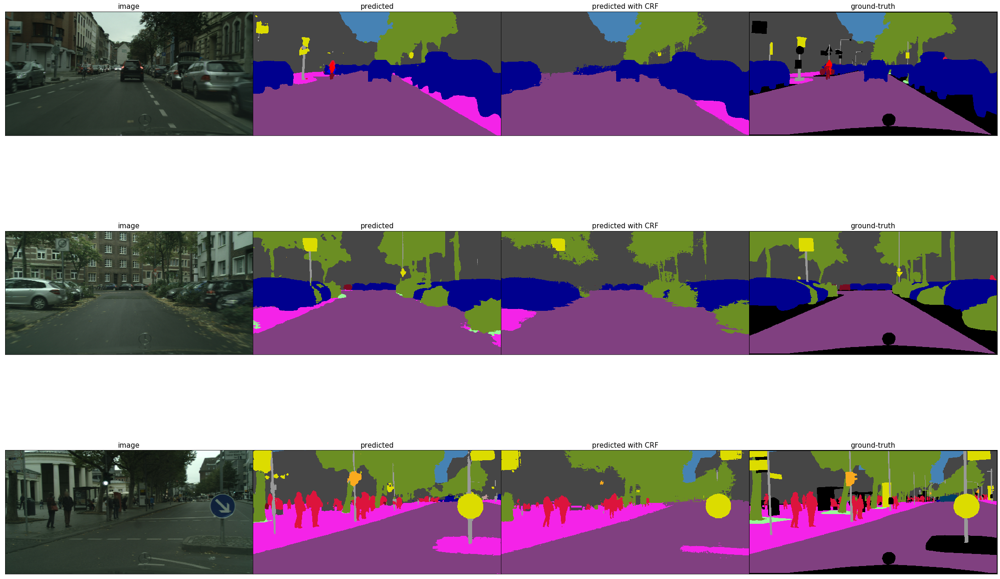

In [98]:
# Process:
image_show, predicted_show, gt_show = postprocess_to_show_images(image=val_image_samples,
                                                                 pred=tf.expand_dims(preds, axis=-1),
                                                                 gt=val_gt_samples,
                                                                 one_hot=True,
                                                                 ratio=2)

pred_crf_show = tf.squeeze(postprocess_to_show_images(image=None,
                                                      pred=tf.expand_dims(preds_crf, axis=-1),
                                                      one_hot=True,
                                                      ratio=2)
                          )

# Compute additional Metrics:
# For Accuracy:
acc_func = SegmentationAccuracy()
acc = acc_func(val_gt_samples, preds_softmax)
acc_crf = acc_func(val_gt_samples, preds_crf_softmax)

# For Mean IoU:
miou_func = SegmentationMeanIoU(nb_classes)
miou     = miou_func(val_gt_samples, preds_softmax)
miou_crf = miou_func(val_gt_samples, preds_crf_softmax)


# Plot:
fig = plot_images_inGrid(images=[image_show.numpy(), predicted_show.numpy(), pred_crf_show.numpy(), gt_show.numpy()], 
                         titles=["image",'predicted', 'predicted with CRF', 'ground-truth'])
fig.show()

# Print the metrics:
print('Acc. = {0:5.2f}% ; Acc. w/ CRF = {1:5.2f}%\t|\t mIoU = {2:5.2f} ; mIoU w/ CRF = {3:5.2f}.'.format(
    acc.numpy() * 100, acc_crf.numpy() * 100, miou, miou_crf))

### Observation:

Interestingly, the accuracy with CRF is less compared to the non-CRF results. It can be seen that the pole of the signs were removed in the last diagram. Although this was not the intended results, further tuning of the CRF methods' hyperparameters can be done to improve the output results. The various hyperparameters of CRF are "(sxy, srgb, compat)". Care must also be taken when tuning, as too high values given would result in label maps that are too smoothed where the smaller classes or details would be lost.

## 17 - Further Tuning of the CRF:

Here, the hyperparameters will be experimented with to achieve better accuracy result.

### 17.1 - Define a Tunable CRF function with Hyperparameters: "(sxy, srgb, compat)"

Here, the tuning will be performed on the "Pairwise potentials". 
More can be seen in the link: https://github.com/lucasb-eyer/pydensecrf

In [106]:
def crf_withTuning_postprocessing(input_image, predicted_probs, sxy_Guassian, 
                               sxy_Bilateral, srgb_Bilateral, compat):
    """ this uses the CRF method to post-process the predicted label maps.
    Parameters:
        - input_image, is the Original input RGB image of shape (H x W x 3)
        - predicted_probs, is hte Predicted softmax map(s) of shape (H x W x N)
            where N = number of classes.
    Returns:
        - returns a Refined Softmax Map as Numpy Array with shape (H x W x N).
    """
    # Define the number of classes:
    nb_classes = predicted_probs.shape[-1]
    
    # Define the height and width of image:
    h, w = input_image.shape[:2]
    
    # Instantiate a DenseCRF2D:
    d = densecrf.DenseCRF2D(w, h, nb_classes)
    
    # For densecrf, the predictions has to be formatted with channels being first in time.
    # This means the requirement of transposing the image:
    predicted_probs = np.ascontiguousarray( predicted_probs.transpose((2, 0, 1)) )
    
    # For predictions, densecrf needs unary values (like, -Log(probs)):
    predicted_unary = unary_from_softmax(predicted_probs)
    d.setUnaryEnergy(predicted_unary)
    
    # densecrf taks into account of additional features to refine the predicted label maps.
    # As explained in the `pydensecrf` repo, there is a need to add the color-independent term, 
    # where features are the locations only:
    d.addPairwiseGaussian(sxy=sxy_Guassian, 
                          compat=compat, 
                          kernel=densecrf.DIAG_KERNEL, 
                          normalization=densecrf.NORMALIZE_SYMMETRIC)
    
    # Next, add the colour-dependent term:
    # features that are (x, y, r, g, b) based on the input image:
    input_image_uint = (input_image * 255).astype(np.uint8)
    d.addPairwiseBilateral(sxy=sxy_Bilateral, 
                           srgb=srgb_Bilateral, 
                           rgbim=input_image_uint,
                           compat=compat, 
                           kernel=densecrf.DIAG_KERNEL, 
                           normalization=densecrf.NORMALIZE_SYMMETRIC)
    
    # Lastly, perform several inference to obtain the refined predictions:
    refined_preds = np.array( d.inference(5) ).reshape(nb_classes, h, w)
    
    # Transpose the predictions back:
    refined_preds = np.transpose(refined_preds, (1, 2, 0))
    
    return refined_preds
    

In [107]:
def predict_with_tuned_crf(images, sxy_Guassian=(20, 20), sxy_Bilateral=(80, 80), 
                             srgb_Bilateral=(5, 5, 5), compat=10):
    """ This utilises the Model combined with CRF to predict the label map,
        and post-process the data for visualisation.
    Parameters:
        - images, are the Input Images.
    Returns:
        - returns the Predictions (before and after CRF).
    """
    # Predict with the model:
    preds_softmax = unet_model_with_softmax.predict(images)
    
    # Post-process with CRFs:
    preds_crf_softmax = []
    for i in range(len(images)):
        pred_crf_softmax = crf_withTuning_postprocessing(images[i], 
                                                         preds_softmax[i],
                                                         sxy_Guassian, 
                                                         sxy_Bilateral, 
                                                         srgb_Bilateral, 
                                                         compat)
        preds_crf_softmax.append(pred_crf_softmax)
    
    # Stack/update the list:
    preds_crf_softmax = np.stack(preds_crf_softmax)
    
    # Take the predictions before CRFs:
    preds_softmax = tf.constant(preds_softmax)
    preds = tf.math.argmax(preds_softmax, axis=-1)
    
    # Take the predictions after CRFs;
    preds_crf_softmax = tf.constant(preds_crf_softmax)
    preds_crf = tf.math.argmax(preds_crf_softmax, axis=-1)
    
    return preds_softmax, preds, preds_crf_softmax, preds_crf  
 

## 17.2 - Choose the Hyperparameters for CRF:

In [154]:
sxy_Guassian=(2, 2)
sxy_Bilateral=(3, 3)
srgb_Bilateral=(3, 3, 3)
compat=20

In [155]:
# Post-Process:
preds_softmax, preds, preds_crf_softmax, preds_crf = predict_with_tuned_crf(images=val_image_samples.numpy(),
                                                                           sxy_Guassian=sxy_Guassian,
                                                                           sxy_Bilateral=sxy_Bilateral,
                                                                           srgb_Bilateral=srgb_Bilateral,
                                                                           compat=compat)

D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\ipykernel_launcher.py:29: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


Acc. = 95.85% ; Acc. w/ CRF = 95.85%	|	 mIoU =  0.51 ; mIoU w/ CRF =  0.51.


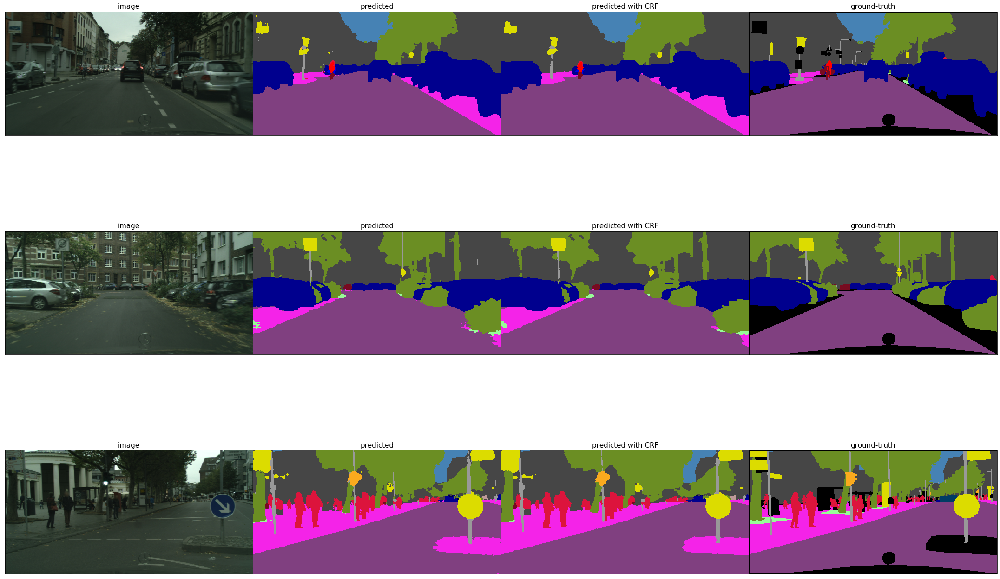

In [156]:
# Process:
image_show, predicted_show, gt_show = postprocess_to_show_images(image=val_image_samples,
                                                                 pred=tf.expand_dims(preds, axis=-1),
                                                                 gt=val_gt_samples,
                                                                 one_hot=True,
                                                                 ratio=2)

pred_crf_show = tf.squeeze(postprocess_to_show_images(image=None,
                                                      pred=tf.expand_dims(preds_crf, axis=-1),
                                                      one_hot=True,
                                                      ratio=2)
                          )

# Compute additional Metrics:
# For Accuracy:
acc_func = SegmentationAccuracy()
acc = acc_func(val_gt_samples, preds_softmax)
acc_crf = acc_func(val_gt_samples, preds_crf_softmax)

# For Mean IoU:
miou_func = SegmentationMeanIoU(nb_classes)
miou     = miou_func(val_gt_samples, preds_softmax)
miou_crf = miou_func(val_gt_samples, preds_crf_softmax)


# Plot:
fig = plot_images_inGrid(images=[image_show.numpy(), predicted_show.numpy(), pred_crf_show.numpy(), gt_show.numpy()], 
                         titles=["image",'predicted', 'predicted with CRF', 'ground-truth'])
fig.show()

# Print the metrics:
print('Acc. = {0:5.2f}% ; Acc. w/ CRF = {1:5.2f}%\t|\t mIoU = {2:5.2f} ; mIoU w/ CRF = {3:5.2f}.'.format(
    acc.numpy() * 100, acc_crf.numpy() * 100, miou, miou_crf))

### Observation:

With many trials and errors, lowering the values of the hyperparameters seems to help achieve similar scores between the accuracy with or without CRF. The changes in the diagrams are subtle where certain coarse masks were smoothed out. Overall, with these slightly better smooth and having a similar accuracy is still a good outcome of the post-processing method.

## 18 - Further Refinements:

There are several other ways to tackle the refinement phase for the segmentation task, and these are:

- Transfer learning -> The U-Net model can be pre-trained (can be done with some of the layers as well) on other datasets or tasks is a way to ensure that the performance improves. For example, since semantic segmentation datasets are hard to come by or gather, the alternative is to train the encoding segments of the network that are also extended with dense layers (fully-connected layers) to classify a larger dataset like ImageNet.

- Loss weighing/combining -> This method allows the emphasis on specific classes, like the weighing strategy employed in the previous notebook (3). The Dice Loss here can be extended with a cross-entropy component to improve and balance out the classes.

- Multi-task training -> An interesting approach is to build enocder-decoder models that consists of multiple decoders coupled with a single encoder. Each of these decoder will be used to tackle different task such as semantic segmentation, contour extraction, depth regression and so on. Each of the decoder of the multi-task models can perform better when compared to just training one decoder to perform all these tasks. The U-Net model here can therefore be extended to tackle auxiliary task such as contour extraction.

## 19 - Instance Segmentation:

To achieve Instance Segmentation here, the method that will be applied is: __transforming class label maps into instance maps by use of morphological methods__.

In more detail, the __Deep Watershed Transform for Instance Segmentation__ (by Min Bai and Raquel Urtasun,) as a pre-trained model will be applied. This model was pre-trained on Cityscapes dataset and can be found here: https://github.com/min2209/dwt.

Note: the orignal code was written in Python 2 and the updated Python 3 modules can be found and downloaded here: https://github.com/benjaminplanche/dwt.git

### 19.1 - Download Updated Repo and the Pre-trained parameters:

In [166]:
# Download the DWT pre-trained parameters provided by the authors:
!mkdir .\dwt_python3\model
!wget http://www.cs.toronto.edu/~mbai/dwt_cityscapes_pspnet.mat -P .\dwt_python3\model\

Next, is to download the ZIP files from the repo: "https://github.com/benjaminplanche/dwt.git" and save these under the folder: .\dwt_python3

### 19.2 - Instatiate and Initialise the model:

In [173]:
# Import the Required Libraries:
from dwt_python3.E2E.network_init import get_model
from dwt_python3.E2E.io_utils import ssProcess
from dwt_python3.E2E.post_process import watershed_cut

In [174]:
# Define the model weight path:
dwt_model_weight_path =  ["./dwt_python3/model/dwt_cityscapes_pspnet.mat"]

#### Build the Deep Watershed Transform Model:

In [178]:
# Define the model inputs:
pred_crf_input = tf.keras.layers.Input(dtype=tf.float32, 
                                       shape=preds_crf.shape[-2:])

pred_crf_bin_input = tf.keras.layers.Input(dtype=tf.float32, 
                                           shape=preds_crf.shape[-2:])

orig_image_input = inputs

# Instantiate the model:
dwt_model = get_model(modelWeightPaths=dwt_model_weight_path)


### 19.3 - Instance prediction from the segmentation results:

Note: Since the DWT model was implemented with TF version 1, the new code was adopted to be compatible with TF version 2. It coverts the model-building method directly into an inference model. The method was not renamed to be similar with the original structure, therefore the usage is only fine for a one-time inference solution, but would not be suited for training purposes.

In [180]:
# Process the data prior to prediction:
pred, pred_mask = ssProcess(preds_crf.numpy())

# Prediction with model:
dwt_model.build(val_image_samples, 
                pred, 
                pred_mask, 
                keepProb=tf.constant(1.))

# The inference results were stored as an attribute of the model: .outputDataArgMax
dwt_pred = dwt_model.outputDataArgMax.numpy()

instance_samples = [watershed_cut(dwt_pred[i], pred_mask[i]) for i in range(len(dwt_pred))]
instance_samples = tf.convert_to_tensor(instance_samples)

building direction net
loaded direction/conv1_1/weights
loaded direction/conv1_1/biases
loaded direction/conv1_2/weights
loaded direction/conv1_2/biases
loaded direction/conv2_1/weights
loaded direction/conv2_1/biases
loaded direction/conv2_2/weights
loaded direction/conv2_2/biases
loaded direction/conv3_1/weights
loaded direction/conv3_1/biases
loaded direction/conv3_2/weights
loaded direction/conv3_2/biases
loaded direction/conv3_3/weights
loaded direction/conv3_3/biases
loaded direction/conv4_1/weights
loaded direction/conv4_1/biases
loaded direction/conv4_2/weights
loaded direction/conv4_2/biases
loaded direction/conv4_3/weights
loaded direction/conv4_3/biases
loaded direction/conv5_1/weights
loaded direction/conv5_1/biases
loaded direction/conv5_2/weights
loaded direction/conv5_2/biases
loaded direction/conv5_3/weights
loaded direction/conv5_3/biases
loaded direction/fcn5_1/weights
loaded direction/fcn5_1/biases
loaded direction/fcn5_2/weights
loaded direction/fcn5_2/biases
loaded

### 19.4 - Visualise:

D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\ipykernel_launcher.py:20: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


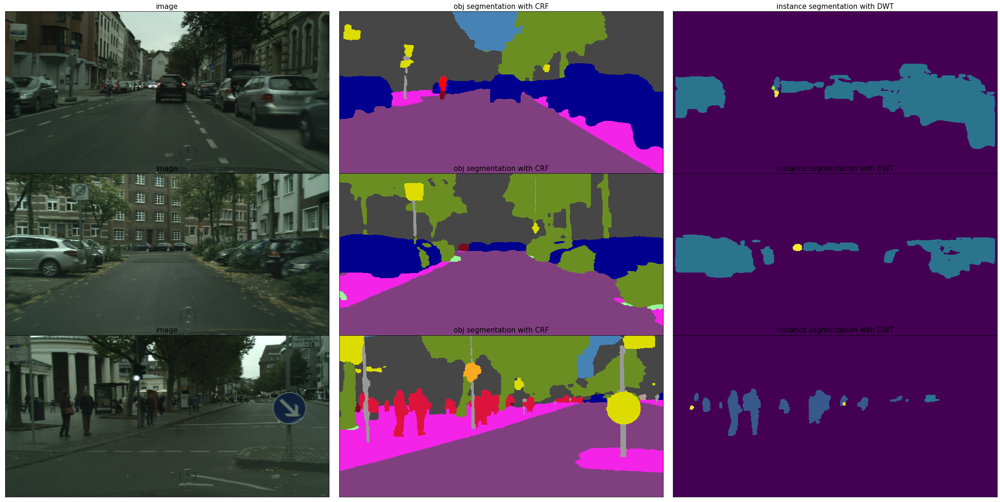

In [184]:
# Process:
image_show, gt_show = postprocess_to_show_images(image=val_image_samples,
                                                 gt=val_gt_samples,
                                                 one_hot=True,
                                                 ratio=2)

instance_show = tf.squeeze(postprocess_to_show_images(image=tf.expand_dims(instance_samples, axis=-1),
                                                      pred=None,
                                                      one_hot=True,
                                                      ratio=2)
                          )

# To accentuate the difference of colors between instances:
instance_show = instance_show ** 4 


# Plot:
fig = plot_images_inGrid(images=[image_show.numpy(),  pred_crf_show.numpy(), instance_show.numpy()], 
                         titles=["image",'obj segmentation with CRF', 'instance segmentation with DWT'])
fig.show()



### Observation:

The output from the DWT model was able to split some of the objects from both the input images and label maps, however, the instances shown are not clearly defined. It looks more like a mass of separated colours. 

NOTE: According to the Repo seen in the diagram below:

<img src="Description Images/DWT_repo_comment.PNG" width="750">

Image Ref -> https://github.com/min2209/dwt

It states that the label's id are combined in a format that are like "24001" where "24" is the ID for a person, or "20001" where "20" is the ID for a traffic sign.

### 19.5 - Check the Label Values of the Instance Tensor:

In [ ]:
print("Instance label values:\n", np.unique(instance_samples))

Armed with this information, the DWT output results can be further interpreted to display individual Label ID for any interested instances, from the input images.

### 19.6 - Isolate the individual instances based on the label ID:

Here, the example ID taken will be "car", "traffic light", "person".

In [186]:
id_of_interest = 'car'

# Define the ID label + Mask:
instance_id_label = cityscapes_labels.name2label[id_of_interest]
instance_mask = tf.equal( (instance_samples // 1000), instance_id_label.id )

# Select and Filter the required ID label and mask:
instance_id_samples = instance_samples

instance_id_samples = tf.where(condition=instance_mask, # Condition placed.
                               x=instance_id_samples, # If TRUE, keep the value
                               y=tf.zeros_like(instance_id_samples)) # If FALSE, replace as 0

instance_id_samples = instance_id_samples % 1000

D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\ipykernel_launcher.py:13: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  del sys.path[0]


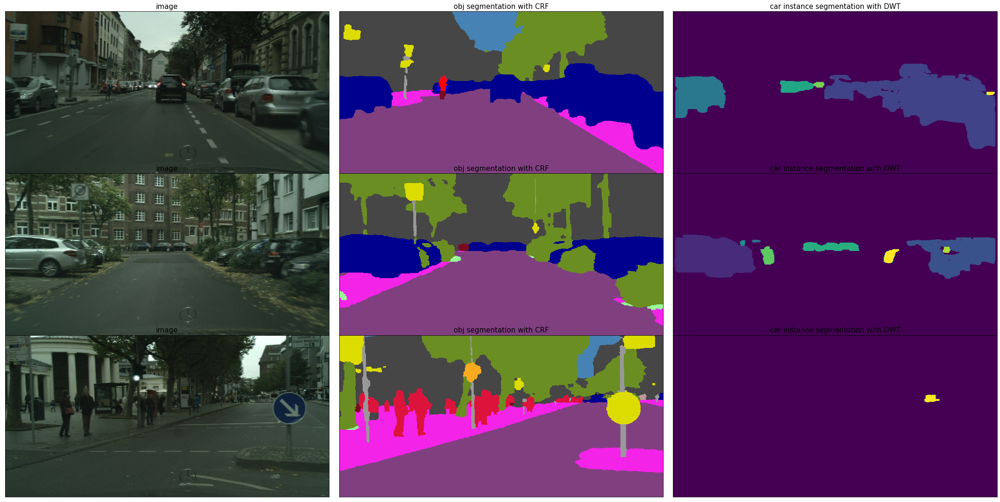

In [187]:
# Process:
instance_show = tf.squeeze(postprocess_to_show_images(image=tf.expand_dims(instance_id_samples, axis=-1),
                                                      pred=None,
                                                      one_hot=True,
                                                      ratio=2)
                          )

# instance_show = (tf.squeeze(instance_show) * 255) / tf.reduce_max(instance_show) 

# Plot:
fig = plot_images_inGrid(images=[image_show.numpy(),  pred_crf_show.numpy(), instance_show.numpy()], 
                         titles=["image",'obj segmentation with CRF', '{} instance segmentation with DWT'.format(id_of_interest)])
fig.show()


### Observation:

It looks like it worked. the instances of cars were succesfully extracted by the DWT model.

### 19.7 - Check out more label instances:

D:\anaconda3\envs\Py37Work_TF2Alpha\lib\site-packages\ipykernel_launcher.py:29: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


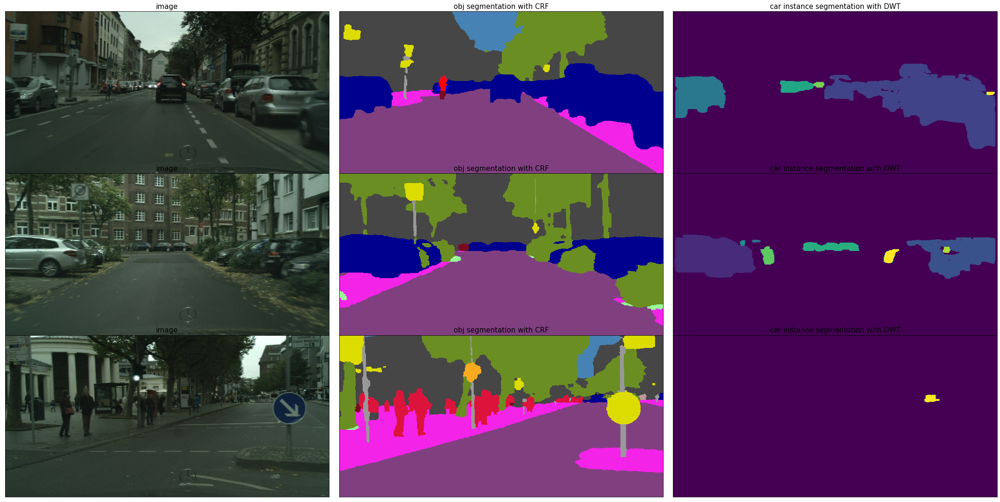

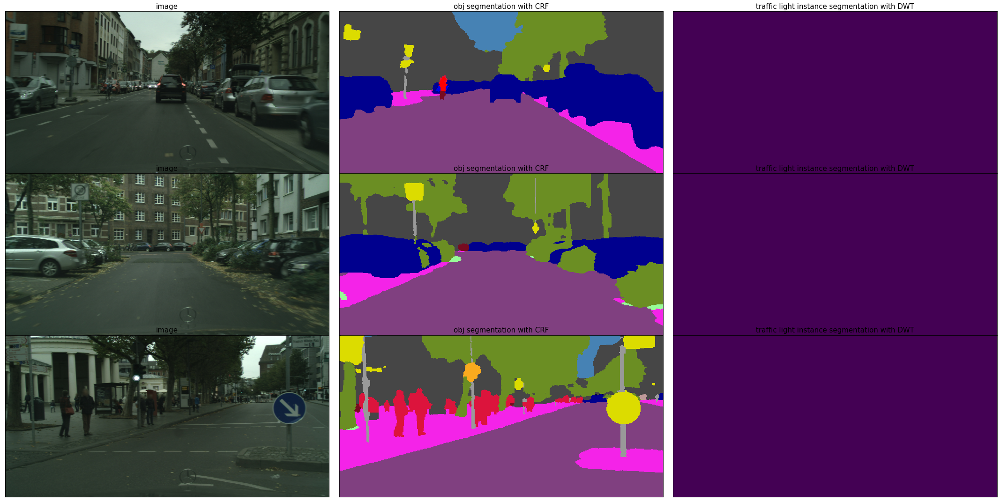

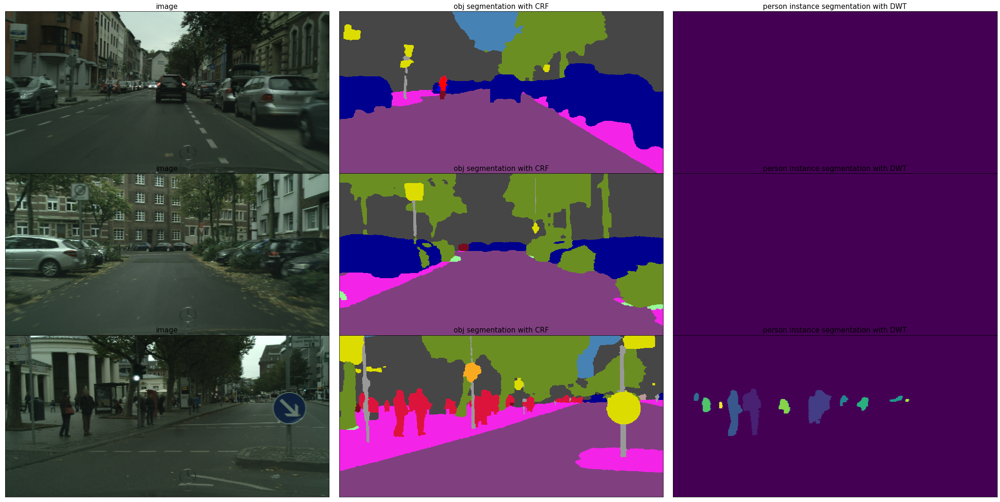

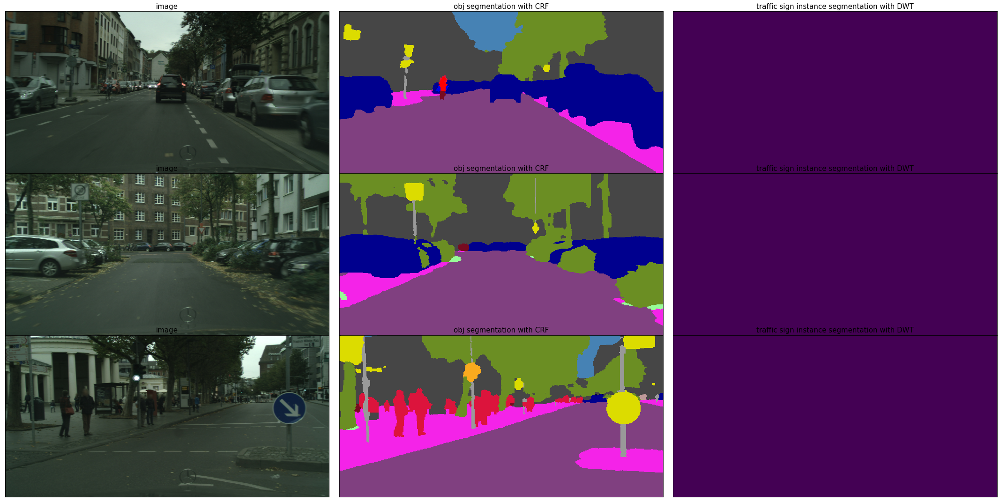

In [190]:
id_of_interest_list = ["car", "traffic light", "person", "traffic sign"]

for id_of_interest in id_of_interest_list:
    # Define the ID label + Mask:
    instance_id_label = cityscapes_labels.name2label[id_of_interest]
    instance_mask = tf.equal( (instance_samples // 1000), instance_id_label.id )

    # Select and Filter the required ID label and mask:
    instance_id_samples = instance_samples

    instance_id_samples = tf.where(condition=instance_mask, # Condition placed.
                                   x=instance_id_samples, # If TRUE, keep the value
                                   y=tf.zeros_like(instance_id_samples)) # If FALSE, replace as 0

    instance_id_samples = instance_id_samples % 1000

    # Process:
    instance_show = tf.squeeze(postprocess_to_show_images(image=tf.expand_dims(instance_id_samples, axis=-1),
                                                          pred=None,
                                                          one_hot=True,
                                                          ratio=2)
                              )

    # instance_show = (tf.squeeze(instance_show) * 255) / tf.reduce_max(instance_show) 

    # Plot:
    fig = plot_images_inGrid(images=[image_show.numpy(),  pred_crf_show.numpy(), instance_show.numpy()], 
                             titles=["image",'obj segmentation with CRF', '{} instance segmentation with DWT'.format(id_of_interest)])
    fig.show()


### Observation:

It can be seen that for certain labels, the DWT was not able to capture the designated instances such as traffic lights or signs. It could mean that some further tuning could be required. 

## Project Summary:



In [ ]:
# <img src="Description Images/.png" width="750">

# Image Ref -> 

# <img src="Description Images/.png" width="750">

# Image Ref -> 